<div style="
    margin-left: 5%;
    width: 80%;
    text-align: center;
    padding: 40px;
    background: linear-gradient(to right, #f0f0f0, #ffffff);
    border-radius: 16px;
    box-shadow: 0 4px 12px rgba(0, 0, 0, 0.1);
    font-family: 'Segoe UI', sans-serif;
">

# 🎓 **End Semester Project**
## Data Base and Interoperability
### 👥 Students : *ETHEVE Clément, DO VALE Lucas*  
### 📅 Date : 23 May 2025

</div>

# Importation des librairies

In [146]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split
%matplotlib inline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
import plotly.express as px
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.stats import gaussian_kde
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import plotly.graph_objects as go
import hvplot.pandas
from sklearn.neighbors import KNeighborsClassifier


# Data loading and preprocessing

In [147]:
data_clubs=pd.read_csv("clubs_fr.csv")
data_clubs=data_clubs.drop("name",axis=1) #useless in our prediction
data_clubs=data_clubs.drop("foreigners_number",axis=1) #Data already contained in "foreigners_percentage"


data_events=pd.read_csv("game_events.csv")
data_events=data_events.drop("minute",axis=1)# We simplify the dates

data_playerapp=pd.read_csv("player_appearance.csv")
data_lineup=pd.read_csv("game_lineups.csv")
data_value=pd.read_csv("player_valuation_before_season.csv")

data_matchs=pd.read_csv("matchs_2013_2022.csv")
data_matchs2=pd.read_csv("match_2023.csv")


/tmp/ipython-input-1522881173.py:10: DtypeWarning:

Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.



## Data_clubs

In [148]:
data_clubs.head()

,club_id,club_code,domestic_competition_id,squad_size,average_age,foreigners_percentage,national_team_players,stadium_name,stadium_seats,net_transfer_record,coach_name
0,969,montpellier-hsc,FR1,25,25.7,48.0,8,Stade de la Mosson,32939,+€28.60m,NaN
1,1082,losc-lille,FR1,25,25.4,72.0,7,Decathlon Arena-Stade Pierre-Mauroy,50186,+€3.65m,NaN
2,1160,nimes-olympique,FR1,26,25.4,46.2,3,Stade des Antonins,8033,+€2.50m,NaN
3,3911,stade-brest-29,FR1,24,26.0,25.0,3,Stade Francis-Le Blé,15220,+€5.10m,NaN
4,595,sc-bastia,FR1,25,27.6,32.0,6,Stade Armand-Cesari,16480,+€480k,NaN


In [149]:
data_clubs["coach_name"].unique()

array([nan])

In [150]:
data_clubs=data_clubs.drop("coach_name",axis=1)

In [151]:
data_clubs["domestic_competition_id"].unique()
data_clubs=data_clubs.drop("domestic_competition_id",axis=1)

In [152]:
data_clubs[data_clubs["squad_size"]<11]

,club_id,club_code,squad_size,average_age,foreigners_percentage,national_team_players,stadium_name,stadium_seats,net_transfer_record
18,3558,gfc-ajaccio,5,26.8,20.0,1,Stade Ange-Casanova,4050,+-0


It seems that one of the data entries is problematic (a match cannot be played with only 5 players). Let’s check whether we can remove the records related to this team.

In [153]:
gfc_ajaccio_id = 3558

gfc_ajaccio_matchs = data_matchs[
    (data_matchs["home_club_id"] == gfc_ajaccio_id) |
    (data_matchs["away_club_id"] == gfc_ajaccio_id)
]


gfc_ajaccio_matchs.head()

,Unnamed: 0,game_id,season,round,date,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,...,stadium,attendance,referee,home_club_formation,away_club_formation,home_club_name,away_club_name,aggregate,competition_type,results
26,305,2586999,2015,13. Matchday,2015-11-07,1421,3558,1,2,14.0,...,Stade Auguste-Delaune,11393.0,Said Ennjimi,4-2-3-1,4-3-1-2,Stade de Reims,GFC Ajaccio,1:2,domestic_league,-1
70,746,2586768,2015,1. Matchday,2015-08-08,1095,3558,0,0,10.0,...,Stade de l'Aube,10858.0,Jérôme Miguelgorry,4-2-3-1,4-4-2 double 6,ESTAC Troyes,GFC Ajaccio,0:0,domestic_league,0
290,4093,2609774,2015,31. Matchday,2016-03-20,417,3558,3,0,3.0,...,Allianz Riviera,19066.0,Nicolas Rainville,4-3-1-2,5-3-2,Olympique Gymnaste Club Nice Côte d'Azur,GFC Ajaccio,3:0,domestic_league,1
321,4484,2587015,2015,15. Matchday,2015-11-28,3558,1158,1,1,16.0,...,Stade Ange-Casanova,3514.0,Jérôme Miguelgorry,4-3-1-2,4-1-4-1,GFC Ajaccio,Football Club Lorient-Bretagne Sud,1:1,domestic_league,0
322,4496,2600621,2015,17. Matchday,2015-12-05,3558,995,1,1,15.0,...,Stade Ange-Casanova,3614.0,Wilfried Bien,4-3-1-2,4-2-3-1,GFC Ajaccio,Football Club de Nantes,1:1,domestic_league,0


It seems that all matches involving this team are quite old (before 2016). Let’s check whether they appear in the dataset we want to predict.

In [154]:

gfc_ajaccio_id = 3558


gfc_ajaccio_matchs = data_matchs2[
    (data_matchs2["home_club_id"] == gfc_ajaccio_id) |
    (data_matchs2["away_club_id"] == gfc_ajaccio_id)
]


print(len(gfc_ajaccio_matchs))

0


The assumption turns out to be correct, so we will remove this club to improve data quality.

In [155]:

gfc_ajaccio_id = 3558

# 1. Identifier tous les matchs impliquant le club (domicile ou extérieur)
match_ids_to_remove_1 = data_matchs[
    (data_matchs["home_club_id"] == gfc_ajaccio_id) |
    (data_matchs["away_club_id"] == gfc_ajaccio_id)
]["game_id"].tolist()

match_ids_to_remove_2 = data_matchs2[
    (data_matchs2["home_club_id"] == gfc_ajaccio_id) |
    (data_matchs2["away_club_id"] == gfc_ajaccio_id)
]["game_id"].tolist()

all_game_ids_to_remove = set(match_ids_to_remove_1 + match_ids_to_remove_2)

# 2. Supprimer dans data_events
data_events = data_events[
    (data_events["club_id"] != gfc_ajaccio_id) &
    (~data_events["game_id"].isin(all_game_ids_to_remove))
]

# 3. Supprimer dans data_playerapp
data_playerapp = data_playerapp[
    (data_playerapp["player_club_id"] != gfc_ajaccio_id) &
    (data_playerapp["player_current_club_id"] != gfc_ajaccio_id) &
    (~data_playerapp["game_id"].isin(all_game_ids_to_remove))
]

# 4. Supprimer dans data_lineup
data_lineup = data_lineup[
    (data_lineup["club_id"] != gfc_ajaccio_id) &
    (~data_lineup["game_id"].isin(all_game_ids_to_remove))
]

# 5. Supprimer dans data_value
data_value = data_value[data_value["current_club_id"] != gfc_ajaccio_id]

# 6. Supprimer dans data_clubs
data_clubs = data_clubs[data_clubs["club_id"] != gfc_ajaccio_id]

# 7. Supprimer dans les matchs
data_matchs = data_matchs[
    (data_matchs["home_club_id"] != gfc_ajaccio_id) &
    (data_matchs["away_club_id"] != gfc_ajaccio_id)
]

data_matchs2 = data_matchs2[
    (data_matchs2["home_club_id"] != gfc_ajaccio_id) &
    (data_matchs2["away_club_id"] != gfc_ajaccio_id)
]

print("All data of GFC Ajaccio have been deleted.")

All data of GFC Ajaccio have been deleted.


In [156]:
data_clubs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34 entries, 0 to 34
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   club_id                34 non-null     int64  
 1   club_code              34 non-null     object 
 2   squad_size             34 non-null     int64  
 3   average_age            34 non-null     float64
 4   foreigners_percentage  34 non-null     float64
 5   national_team_players  34 non-null     int64  
 6   stadium_name           34 non-null     object 
 7   stadium_seats          34 non-null     int64  
 8   net_transfer_record    34 non-null     object 
dtypes: float64(2), int64(4), object(3)
memory usage: 2.7+ KB


In [157]:
data_clubs["net_transfer_record"]

,net_transfer_record
0,+€28.60m
1,+€3.65m
2,+€2.50m
3,+€5.10m
4,+€480k
5,+€30.30m
6,+€62.10m
7,+€10.85m
8,+€1.50m
9,+€12.70m


We will convert this column into more usable data.

In [158]:
# Search for different currency:
data_clubs['net_transfer_record'].str.extract(r'([€$£¥])')[0].unique()

array(['€', nan], dtype=object)

In [159]:
df_nan = data_clubs[data_clubs['net_transfer_record'].isna()]
df_nan

,club_id,club_code,squad_size,average_age,foreigners_percentage,national_team_players,stadium_name,stadium_seats,net_transfer_record


Fortunately, there is no empty value and all the data are in euros

In [160]:
#Transforming in float
df_monnaie = data_clubs['net_transfer_record'].dropna().apply(
    lambda x: x[-1] if isinstance(x, str) else None
).unique()

print("Unit found :", df_monnaie)

Unit found : ['m' 'k' '0']


In [161]:
def conversion_en_millions(value):
    if pd.isna(value):
        return 0

    value = str(value).replace('€', '').strip()  # Convert to string and remove the symbol €


    if value.startswith('+'):
        value = value[1:]
    elif value.startswith('-'):
        value = value

    # Handle values like "+-0" (not a valid number)
    if value == '0':
        return 0

    # Conversion
    if value.endswith('m'):
        return float(value.replace('m', ''))
    elif value.endswith('k'):
        return float(value.replace('k', '')) / 1000
    else:
        return float(value)  # If there is no suffix, return the value directly

# Apply the function to each element of the column
data_clubs["net_transfer_record_num"] = data_clubs["net_transfer_record"].apply(conversion_en_millions)

# Show the result
print(data_clubs["net_transfer_record_num"])

0      28.60
1       3.65
2       2.50
3       5.10
4       0.48
5      30.30
6      62.10
7      10.85
8       1.50
9      12.70
10     -0.00
11     -0.00
12     22.05
13      2.52
14    -22.60
15      6.30
16     31.99
17      3.05
19    -16.20
20     -0.00
21    -30.20
22   -247.00
23      3.70
24     12.85
25     -0.00
26      3.50
27      8.90
28     -2.90
29      0.70
30      3.64
31     -4.05
32    -33.69
33     -0.00
34     23.70
Name: net_transfer_record_num, dtype: float64


In [162]:
# Number of empty value per column
print(data_clubs.isnull().sum())

# Percentage of empty values
print((data_clubs.isnull().mean() * 100).round(2).sort_values(ascending=False))

club_id                    0
club_code                  0
squad_size                 0
average_age                0
foreigners_percentage      0
national_team_players      0
stadium_name               0
stadium_seats              0
net_transfer_record        0
net_transfer_record_num    0
dtype: int64
club_id                    0.0
club_code                  0.0
squad_size                 0.0
average_age                0.0
foreigners_percentage      0.0
national_team_players      0.0
stadium_name               0.0
stadium_seats              0.0
net_transfer_record        0.0
net_transfer_record_num    0.0
dtype: float64


## Data_events

We start by deleting Unnamed 0 which is an index

In [163]:
data_events=data_events.drop(["Unnamed: 0"],axis=1)
data_events.head(3)

,game_event_id,date,game_id,type,club_id,player_id,description,player_in_id,player_assist_id
0,5d2b67957aaae6cf2a41e70cb5d4024f,2012-09-22,2223841,Substitutions,3911,5399,", Not reported",37516.0,NaN
1,cd511880b945623db06ace57349e45b2,2012-09-22,2223841,Goals,3911,24459,", Penalty, 2. Goal of the Season Assist: , Fou...",NaN,24459.0
2,8ca118538b45a24643ab1c9f76e50f6d,2012-09-22,2223841,Substitutions,3911,25113,", Not reported",22053.0,NaN


In [164]:
# Number of empty value per column
print(data_events.isnull().sum())

# Percentage of empty values
print((data_events.isnull().mean() * 100).round(2).sort_values(ascending=False))

game_event_id           0
date                    0
game_id                 0
type                    0
club_id                 0
player_id               0
description         21109
player_in_id        14808
player_assist_id    38413
dtype: int64
player_assist_id    94.42
description         51.89
player_in_id        36.40
game_event_id        0.00
date                 0.00
club_id              0.00
type                 0.00
game_id              0.00
player_id            0.00
dtype: float64


In [165]:
data_events["player_in_id"] = data_events["player_in_id"].fillna(0)
data_events["player_assist_id"]=data_events["player_assist_id"].fillna(0)

Nothing else here is concerning. We have the club_id and player_id for each row, which is the essential information we may use later for scoring features.

In [166]:
data_events["player_in_id"]=data_events.player_in_id.astype('int')
data_events["player_assist_id"]=data_events.player_assist_id.astype('int')
data_events['date'] = pd.to_datetime(data_events['date'])
data_events.info()


<class 'pandas.core.frame.DataFrame'>
Index: 40681 entries, 0 to 40994
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   game_event_id     40681 non-null  object        
 1   date              40681 non-null  datetime64[ns]
 2   game_id           40681 non-null  int64         
 3   type              40681 non-null  object        
 4   club_id           40681 non-null  int64         
 5   player_id         40681 non-null  int64         
 6   description       19572 non-null  object        
 7   player_in_id      40681 non-null  int64         
 8   player_assist_id  40681 non-null  int64         
dtypes: datetime64[ns](1), int64(5), object(3)
memory usage: 4.1+ MB


# Player_app

In [167]:
data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
# Number of empty value
print(data_playerapp.isnull().sum())

# Percentage of empty value
print((data_playerapp.isnull().mean() * 100).round(2).sort_values(ascending=False))

appearance_id             0
game_id                   0
player_id                 0
player_club_id            0
player_current_club_id    0
date                      0
player_name               0
competition_id            0
yellow_cards              0
red_cards                 0
goals                     0
assists                   0
minutes_played            0
dtype: int64
appearance_id             0.0
game_id                   0.0
player_id                 0.0
player_club_id            0.0
player_current_club_id    0.0
date                      0.0
player_name               0.0
competition_id            0.0
yellow_cards              0.0
red_cards                 0.0
goals                     0.0
assists                   0.0
minutes_played            0.0
dtype: float64


# Data_lineup

In [168]:
data_lineup=data_lineup.drop(["Unnamed: 0"],axis=1)
data_lineup['date'] = pd.to_datetime(data_lineup['date'])
data_lineup["team_captain"]=data_lineup.team_captain.astype(bool)
# There is a problematic value "-" in "number" that we will replace with 0
data_lineup["number"] = pd.to_numeric(data_lineup["number"], errors='coerce').fillna(0).astype(int)

# Data_matchs

In [169]:
data_matchs=data_matchs.drop(["Unnamed: 0"],axis=1)
data_matchs["home_club_position"]=data_matchs.home_club_position.astype(int)
data_matchs["away_club_position"]=data_matchs.away_club_position.astype(int)
data_matchs["attendance"] = data_matchs["attendance"].fillna(0).astype(int)
data_matchs["date"]=pd.to_datetime(data_matchs["date"])

data_matchs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4040 entries, 0 to 4077
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   game_id                 4040 non-null   int64         
 1   season                  4040 non-null   int64         
 2   round                   4040 non-null   object        
 3   date                    4040 non-null   datetime64[ns]
 4   home_club_id            4040 non-null   int64         
 5   away_club_id            4040 non-null   int64         
 6   home_club_goals         4040 non-null   int64         
 7   away_club_goals         4040 non-null   int64         
 8   home_club_position      4040 non-null   int64         
 9   away_club_position      4040 non-null   int64         
 10  home_club_manager_name  4040 non-null   object        
 11  away_club_manager_name  4040 non-null   object        
 12  stadium                 4040 non-null   object       

In [170]:
data_matchs.isnull().sum()

,0
game_id,0
season,0
round,0
date,0
home_club_id,0
away_club_id,0
home_club_goals,0
away_club_goals,0
home_club_position,0
away_club_position,0


# First global visualization

/tmp/ipython-input-2319112815.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




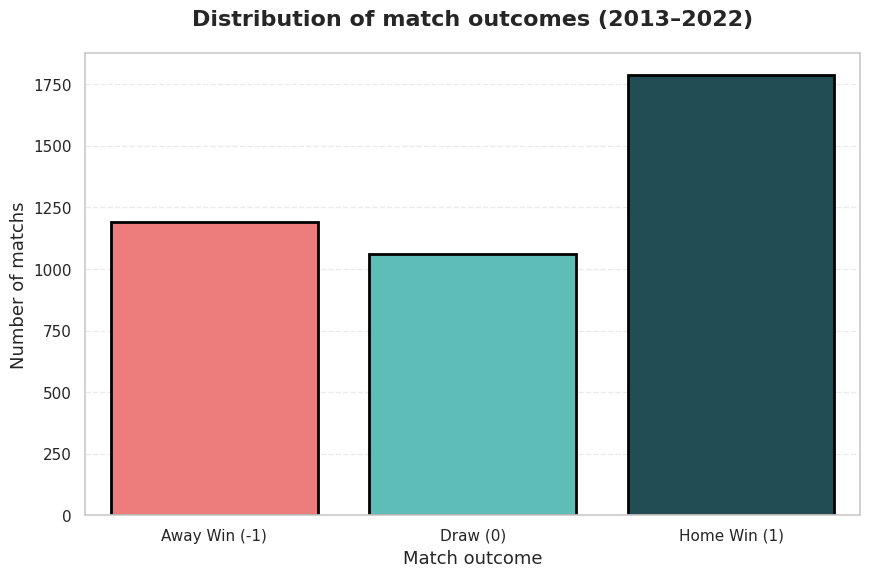

In [171]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))


custom_palette = ["#FF6B6B", "#4ECDC4", "#1A535C"]


ax = sns.countplot(
    x='results',
    data=data_matchs,
    palette=custom_palette,
    linewidth=2,
    edgecolor='black'
)


plt.title('Distribution of match outcomes (2013–2022)', fontsize=16, weight='bold', pad=20)
plt.xlabel('Match outcome', fontsize=13)
plt.ylabel('Number of matchs', fontsize=13)
plt.xticks(ticks=[0, 1, 2], labels=["Away Win (-1)", "Draw (0)", "Home Win (1)"], fontsize=11)


plt.grid(axis='y', linestyle='--', alpha=0.4)


In [172]:
resultats_saison = data_matchs.groupby(['season', 'results']).size().reset_index(name='count')
pivot = resultats_saison.pivot(index='season', columns='results', values='count').fillna(0)
pivot.columns = ['Away (-1)', 'Draw (0)', 'Home (1)']
pivot['Total'] = pivot.sum(axis=1)

for col in ['Home (1)', 'Draw (0)', 'Away (-1)']:
    pivot[col + ' %'] = pivot[col] / pivot['Total'] * 100

df_plot = pivot[[col + ' %' for col in ['Home (1)', 'Draw (0)', 'Away (-1)']]].reset_index()
df_plot = df_plot.melt(id_vars='season', var_name='Outcome', value_name='Percentage')

fig = px.line(
    df_plot,
    x='season',
    y='Percentage',
    color='Outcome',
    markers=True,
    line_dash='Outcome',
    title='Evolution of matches outcome per seasons (2013–2022)',
    template='plotly_white',
    color_discrete_map={
        'Home Win (1) %': '#1f77b4',
        'Draw (0) %': '#ff7f0e',
        'Away Win (-1) %': '#2ca02c'
    }
)

fig.update_layout(
    title_font_size=20,
    xaxis_title='Season',
    yaxis_title='Percentage (%)',
    legend_title='Outcome',
    hovermode='x unified'
)

fig.show()

It therefore seems reasonable to conclude that the home/away parameter is almost invariant in determining the match outcome. This makes it an interesting variable for prediction:

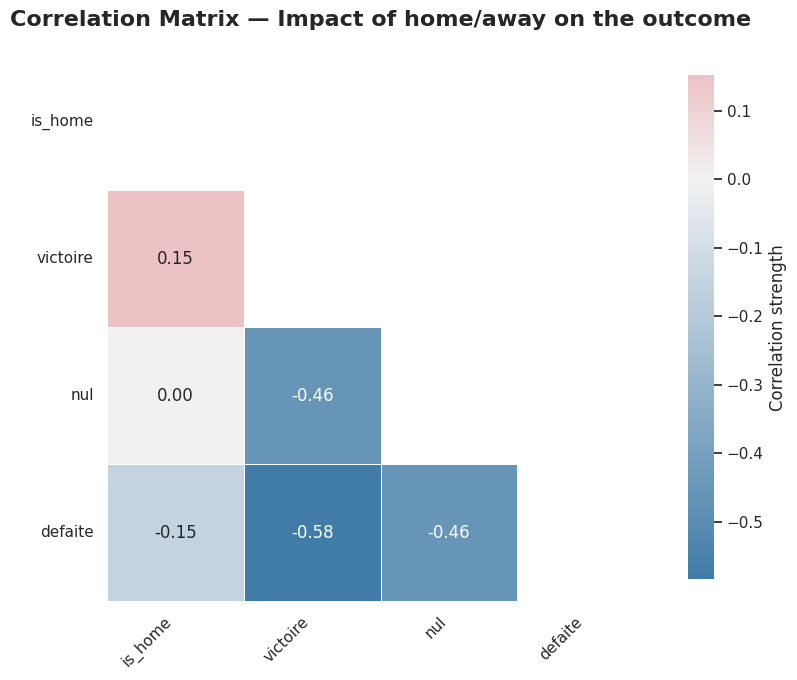

In [173]:
df_home = data_matchs[['game_id', 'home_club_name', 'results']].copy()
df_home = df_home.rename(columns={'home_club_name': 'club'})
df_home['is_home'] = 1
df_home['result_team'] = df_home['results']

df_away = data_matchs[['game_id', 'away_club_name', 'results']].copy()
df_away = df_away.rename(columns={'away_club_name': 'club'})
df_away['is_home'] = 0
df_away['result_team'] = df_away['results'] * -1

# Dataframe fusion
df_long = pd.concat([df_home, df_away], ignore_index=True)

# Binary columns for each outcome
df_long['victoire'] = (df_long['result_team'] == 1).astype(int)
df_long['nul'] = (df_long['result_team'] == 0).astype(int)
df_long['defaite'] = (df_long['result_team'] == -1).astype(int)

# Correlation matrix
corr_matrix = df_long[['is_home', 'victoire', 'nul', 'defaite']].corr()





plt.figure(figsize=(8, 7))
sns.set(style="white")

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

custom_cmap = sns.diverging_palette(240, 10, as_cmap=True)

ax = sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap=custom_cmap,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    linewidths=0.6,
    cbar_kws={
        "shrink": 0.85,
        "orientation": "vertical",
        "label": "Correlation strength"
    }
)

plt.title("Correlation Matrix — Impact of home/away on the outcome", fontsize=16, weight='bold', pad=20)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.yticks(rotation=0, fontsize=11)
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

Thus, it is worth noting that this information could be highlighted further for the model.

In [174]:
# 1.  Add a column for total goals
total_goals = data_matchs["home_club_goals"] + data_matchs["away_club_goals"]
x = total_goals.dropna()
x_range = np.linspace(x.min(), x.max(), 500)
kde = gaussian_kde(x, bw_method=1.5)
kde_y = kde(x_range)

hist_vals, bins = np.histogram(x, bins=range(0, int(x.max())+2), density=True)
bin_centers = 0.5 * (bins[1:] + bins[:-1])

fig = go.Figure()

fig.add_trace(go.Bar(
    x=bin_centers,
    y=hist_vals,
    marker=dict(color='rgba(105, 179, 162, 0.5)', line=dict(color='black', width=1)),
    name='Histogram (density)'
))

fig.add_trace(go.Scatter(
    x=x_range,
    y=kde_y,
    mode='lines',
    name='Smoothed KDE',
    line=dict(color='orangered', width=3)
))

fig.update_layout(
    title='Interactive distribution of goals per match (2013–2022)',
    xaxis_title='Total number of goals',
    yaxis_title='Density',
    template='plotly_white',
    legend=dict(x=0.7, y=0.95, bgcolor='rgba(255,255,255,0.8)'),
    hovermode='x unified'
)

fig.show()

/tmp/ipython-input-2505560185.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



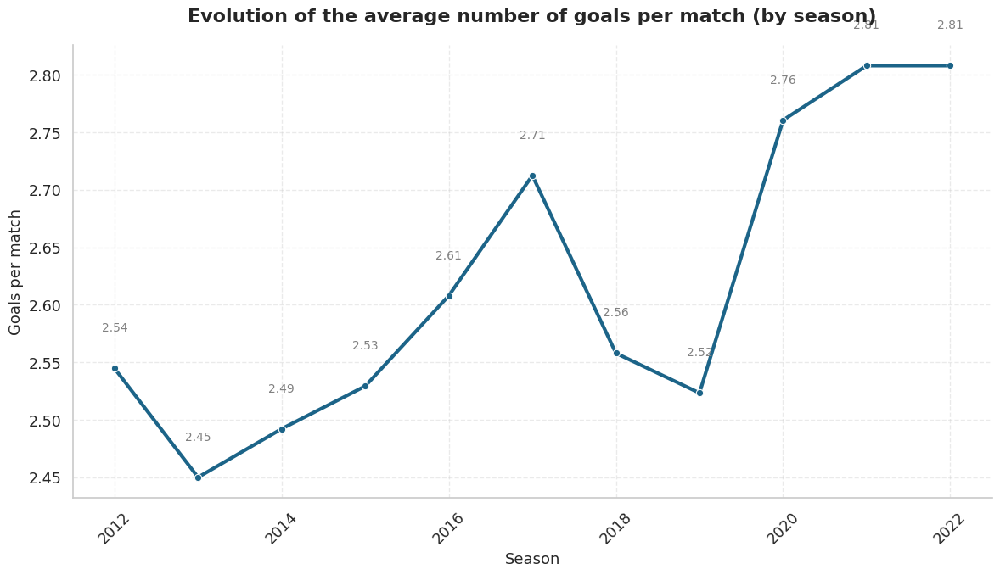

In [175]:

moyenne_buts_par_saison = data_matchs.groupby("season").apply(
    lambda df: (df["home_club_goals"] + df["away_club_goals"]).mean()
).reset_index(name="total_goals")

sns.set(style="whitegrid", font_scale=1.15)

plt.figure(figsize=(12, 7))
palette = sns.color_palette("crest", as_cmap=False)

sns.lineplot(
    data=moyenne_buts_par_saison,
    x="season",
    y="total_goals",
    marker="o",
    linewidth=3,
    color=palette[4]
)

for i, row in moyenne_buts_par_saison.iterrows():
    plt.text(row["season"], row["total_goals"] + 0.03, f"{row['total_goals']:.2f}",
             ha='center', va='bottom', fontsize=10, color='gray')

plt.title("Evolution of the average number of goals per match (by season)", fontsize=16, weight='bold', pad=20)
plt.xlabel("Season", fontsize=13)
plt.ylabel("Goals per match", fontsize=13)
plt.grid(True, linestyle="--", alpha=0.4)
plt.xticks(rotation=45)
sns.despine()
plt.tight_layout()
plt.show()

/tmp/ipython-input-2778092664.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




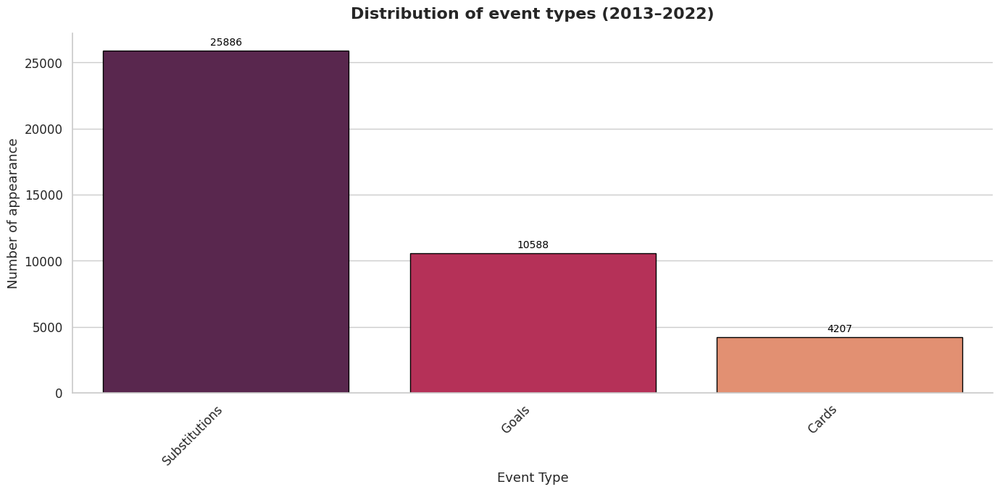

In [176]:
event_counts = data_events["type"].value_counts().reset_index()
event_counts.columns = ["Event Type", "Number"]

plt.figure(figsize=(14, 7))
sns.set(style="whitegrid", font_scale=1.1)

palette = sns.color_palette("rocket", n_colors=len(event_counts))

ax = sns.barplot(
    data=event_counts,
    x="Event Type",
    y="Number",
    palette=palette,
    edgecolor="black"
)

for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", padding=3, fontsize=10, color="black")

plt.title("Distribution of event types (2013–2022)", fontsize=16, weight='bold', pad=15)
plt.xlabel("Event Type", fontsize=13)
plt.ylabel("Number of appearance", fontsize=13)
plt.xticks(rotation=45, ha='right')
sns.despine()
plt.tight_layout()
plt.show()

In [177]:
toutes_saisons = sorted(data_matchs["season"].unique())
cards = data_events[data_events["type"] == "Cards"].copy()
cards["season"] = cards["game_id"].map(data_matchs.set_index("game_id")["season"])
cards_par_saison = cards.groupby("season").size().reindex(toutes_saisons, fill_value=0).reset_index()
cards_par_saison.columns = ["season", "nb_cartons"]


cards_par_saison.hvplot.bar(
    x='season',
    y='nb_cartons',
    title='Total number of cards per season',
    xlabel='Season',
    ylabel='Number of cards',
    color='orange',
    width=800,
    height=400,
    tools=['hover'],
    line_color='black'
)

:Bars   [season]   (nb_cartons)

In [178]:

data_events["season"] = data_events["game_id"].map(data_matchs.set_index("game_id")["season"])


events_2014 = data_events[data_events["season"] == 2014]


print("Event Type in 2014 :", events_2014["type"].unique())

descriptions_cartons = events_2014["description"].dropna().str.lower()
carton_mentions = descriptions_cartons[descriptions_cartons.str.contains("card")]


print(f"Number of events with 'card' in description in 2014 : {len(carton_mentions)}")


Event Type in 2014 : ['Goals' 'Substitutions']
Number of events with 'card' in description in 2014 : 0


It is quite clear that there are missing data here (it is very unlikely that no cards were given for four years). This will need to be taken into account if we plan to create scoring-related features based on these variables.

# First feature enrichment (simple model)

In [179]:
data_matchs_m1=data_matchs.copy()

#### 1) Home/Away: This data is already in the dataframe so we're not gonna touch it

#### 2) Economic strengh of the club

In [180]:
# Filter for year 2022 only
# Convert the column 'date' in datetime
data_value['date'] = pd.to_datetime(data_value['date'])
data_value_2022 = data_value[data_value['date'].dt.year == 2022]


data_value_2022_sorted = data_value_2022.sort_values(['player_id', 'date'])


latest_values_2022 = data_value_2022_sorted.groupby('player_id').tail(1)


club_values_2022 = latest_values_2022.groupby('current_club_id')['market_value_in_eur'].sum().reset_index()


club_values_2022 = club_values_2022.rename(columns={'market_value_in_eur': 'total_market_value_eur'})

club_values_2022.head()

,current_club_id,total_market_value_eur
0,40,31450000
1,162,327660000
2,244,277650000
3,273,298625000
4,290,30500000


We will only keep data from 2022. Some players may have retired in earlier seasons, which could distort the dataset. If a player is not listed recently, this is not too problematic, as it likely indicates that they are less relevant and therefore have a lower impact on the model.

For now, we will not scale the data by the number of players. Our goal here is to capture the overall economic strength of each club. Using an average would remove useful information about squad depth and rotation capacity.

In [181]:
# We rename the column club_id in club_values to merge more easily
club_values = club_values_2022.rename(columns={'current_club_id': 'club_id'})

# Merge for home club
data_matchs_m1 = data_matchs_m1.merge(
    club_values[['club_id', 'total_market_value_eur']],
    left_on='home_club_id', right_on='club_id', how='left'
).rename(columns={'total_market_value_eur': 'home_club_market_value'})


data_matchs_m1 = data_matchs_m1.drop(columns=['club_id'])

# Merge for away club
data_matchs_m1 = data_matchs_m1.merge(
    club_values[['club_id', 'total_market_value_eur']],
    left_on='away_club_id', right_on='club_id', how='left'
).rename(columns={'total_market_value_eur': 'away_club_market_value'})


data_matchs_m1 = data_matchs_m1.drop(columns=['club_id'])

#Check:
data_matchs_m1[['home_club_id', 'home_club_market_value', 'away_club_id', 'away_club_market_value']].head()

,home_club_id,home_club_market_value,away_club_id,away_club_market_value
0,618,56425000,595,5125000
1,14171,3400000,855,7875000
2,1423,1625000,1082,162025000
3,273,298625000,14171,3400000
4,1147,26325000,273,298625000


#### 3) Winrate of clubs

Indeed, clubs are not equivalent. A match between PSG and FC Metz tends to have a fairly predictable outcome…

In [182]:
#Split into two dataframes: home team and away team
home_df = data_matchs_m1[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
home_df = home_df.rename(columns={
    'home_club_id': 'club_id',
    'home_club_goals': 'goals_for',
    'away_club_goals': 'goals_against'
})
home_df['is_home'] = True

away_df = data_matchs_m1[['game_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
away_df = away_df.rename(columns={
    'away_club_id': 'club_id',
    'away_club_goals': 'goals_for',
    'home_club_goals': 'goals_against'
})
away_df['is_home'] = False

# We concatenate both to get two rows per match
match_teams = pd.concat([home_df, away_df], ignore_index=True)

# Result for each club in each match
match_teams['result'] = np.where(
    match_teams['goals_for'] > match_teams['goals_against'], 'win',
    np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
)


win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
total_matches = match_teams.groupby('club_id')['result'].count()

winrate = (win_counts / total_matches).reset_index().rename(columns={0: 'winrate'})

winrate.columns = ['club_id', 'winrate']

#Rename the 'winrate' column for each club to avoid collisions
winrate_home = winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'})
winrate_away = winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'})

# Merge for home club
data_matchs_m1 = data_matchs_m1.merge(winrate_home, on='home_club_id', how='left')

# Merge for away club
data_matchs_m1 = data_matchs_m1.merge(winrate_away, on='away_club_id', how='left')

# Check:
data_matchs_m1[['home_club_id', 'home_club_winrate', 'away_club_id', 'away_club_winrate']].head()

,home_club_id,home_club_winrate,away_club_id,away_club_winrate
0,618,0.389646,595,0.313830
1,14171,0.280702,855,0.296460
2,1423,0.250000,1082,0.448276
3,273,0.399015,14171,0.280702
4,1147,0.175439,273,0.399015


#### 4) Recent winrate (last 2 seasons played)

Important for the analysis (OM’s decline is a good illustration… ;) )

We found that many clubs have no recent information. To avoid removing too many of them, we will not exclude these clubs. Instead, for the recent win rate, we will use the last two seasons that each club actually played.

In [183]:
def calc_recent_winrate_club_2saison(df):
    #Same as before
    home_df = df[['game_id', 'season', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })
    home_df['is_home'] = True

    away_df = df[['game_id', 'season', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })
    away_df['is_home'] = False

    match_teams = pd.concat([home_df, away_df], ignore_index=True)


    match_teams['result'] = np.where(
        match_teams['goals_for'] > match_teams['goals_against'], 'win',
        np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
    )

    # Last two season played per club
    last_two_seasons = (
        match_teams.groupby('club_id')['season']
        .apply(lambda x: sorted(x.unique())[-2:])
        .reset_index(name='last_two_seasons')
    )

    # 4. Fusion
    match_teams = match_teams.merge(last_two_seasons, on='club_id', how='left')
    match_teams['is_recent_season'] = match_teams.apply(
        lambda row: row['season'] in row['last_two_seasons'], axis=1
    )

    recent_matches = match_teams[match_teams['is_recent_season']]


    recent_winrate = (
        recent_matches.groupby('club_id')['result']
        .apply(lambda x: (x == 'win').mean())
        .reset_index()
        .rename(columns={'result': 'recent_winrate'})
    )

    return recent_winrate


recent_winrate = calc_recent_winrate_club_2saison(data_matchs_m1)


recent_winrate_home = recent_winrate.rename(columns={
    'club_id': 'home_club_id',
    'recent_winrate': 'home_recent_winrate'
})


recent_winrate_away = recent_winrate.rename(columns={
    'club_id': 'away_club_id',
    'recent_winrate': 'away_recent_winrate'
})


data_matchs_m1 = data_matchs_m1.merge(recent_winrate_home, on='home_club_id', how='left')
data_matchs_m1 = data_matchs_m1.merge(recent_winrate_away, on='away_club_id', how='left')

# Vérification:
data_matchs_m1[[
    'home_club_name',
    'away_club_name',
    'home_club_winrate',
    'away_club_winrate',
    'home_recent_winrate',
    'away_recent_winrate'
]].head()

,home_club_name,away_club_name,home_club_winrate,away_club_winrate,home_recent_winrate,away_recent_winrate
0,AS Saint-Étienne,SC Bastia,0.389646,0.313830,0.250000,0.297297
1,Thonon Évian Grand Genève FC,EA Guingamp,0.280702,0.296460,0.289474,0.223684
2,Valenciennes FC,Lille Olympique Sporting Club Lille Métropole,0.250000,0.448276,0.250000,0.434211
3,Stade Rennais Football Club,Thonon Évian Grand Genève FC,0.399015,0.280702,0.539474,0.289474
4,AC Ajaccio,Stade Rennais Football Club,0.175439,0.399015,0.144737,0.539474


# Test of Model 1

In [184]:
def enrichissement_m1(data_matchs_to_predict, data_matchs_hist, data_value):
    """
    Enriches data_matchs_to_predict with:
      - economic strength of clubs in 2022
      - historical win rate computed from data_matchs_hist (with outcomes)
      - recent win rate (last two seasons played)
    """



    # -- Economic Power --
    dv = data_value.copy()
    dv['date'] = pd.to_datetime(dv['date'])
    dv_2022 = dv[dv['date'].dt.year == 2022]
    dv_2022 = dv_2022.sort_values(['player_id', 'date'])
    latest_dv = dv_2022.groupby('player_id').tail(1)

    club_values = (
        latest_dv
        .groupby('current_club_id', as_index=False)['market_value_in_eur']
        .sum()
        .rename(columns={
            'current_club_id': 'club_id',
            'market_value_in_eur': 'total_market_value_eur'
        })
    )

    df = data_matchs_to_predict.copy()

    df = df.merge(
        club_values[['club_id', 'total_market_value_eur']],
        left_on='home_club_id', right_on='club_id', how='left'
    ).rename(columns={'total_market_value_eur': 'home_club_market_value'})
    df.drop(columns=['club_id'], inplace=True)

    df = df.merge(
        club_values[['club_id', 'total_market_value_eur']],
        left_on='away_club_id', right_on='club_id', how='left'
    ).rename(columns={'total_market_value_eur': 'away_club_market_value'})
    df.drop(columns=['club_id'], inplace=True)

    # -- Win rate of clubs computed from historical data --
    hist = data_matchs_hist.copy()


    home_df = hist[['home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })
    home_df['is_home'] = True

    away_df = hist[['home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })
    away_df['is_home'] = False

    match_teams = pd.concat([home_df, away_df], ignore_index=True)
    match_teams['result'] = np.where(
        match_teams['goals_for'] > match_teams['goals_against'], 'win',
        np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
    )

    # Winrate
    win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
    total_matches = match_teams.groupby('club_id')['result'].count()
    winrate = (win_counts / total_matches).reset_index(name='winrate')


    winrate_home = winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'})
    winrate_away = winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'})

    df = df.merge(winrate_home, on='home_club_id', how='left')
    df = df.merge(winrate_away, on='away_club_id', how='left')

    # . Recent Winrate (2 last seasons)


    recent_winrate = calc_recent_winrate_club_2saison(data_matchs_hist)

    # Merge recent wr in enrich df
    recent_winrate_home = recent_winrate.rename(columns={'club_id': 'home_club_id', 'recent_winrate': 'home_recent_winrate'})
    recent_winrate_away = recent_winrate.rename(columns={'club_id': 'away_club_id', 'recent_winrate': 'away_recent_winrate'})

    df = df.merge(recent_winrate_home, on='home_club_id', how='left')
    df = df.merge(recent_winrate_away, on='away_club_id', how='left')

    return df
data_matchs2_m1=enrichissement_m1(data_matchs2,data_matchs,data_value)
data_matchs2_m1.head()

,game_id,date,home_club_id,away_club_id,home_club_manager_name,away_club_manager_name,stadium,attendance,referee,home_club_name,away_club_name,competition_type,home_club_market_value,away_club_market_value,home_club_winrate,away_club_winrate,home_recent_winrate,away_recent_winrate
0,4094596,2023-08-26,583,826,Luis Enrique,Franck Haise,Parc des Princes,47000.0,François Letexier,Paris Saint-Germain Football Club,Racing Club de Lens,domestic_league,1132300000,189550000,0.716049,0.421053,0.697368,0.552632
1,4094622,2023-09-16,826,347,Franck Haise,László Bölöni,Stade Bollaert-Delelis,37988.0,Stéphanie Frappart,Racing Club de Lens,Football Club de Metz,domestic_league,189550000,61675000,0.421053,0.229358,0.552632,0.236842
2,4094630,2023-09-24,969,273,Michel Der Zakarian,Bruno Génésio,Stade de la Mosson,15430.0,Stéphanie Frappart,Montpellier Hérault Sport Club,Stade Rennais Football Club,domestic_league,111825000,298625000,0.344828,0.399015,0.355263,0.539474
3,4094647,2023-10-07,347,417,László Bölöni,Francesco Farioli,Stade Saint-Symphorien,23160.0,Jérôme Brisard,Football Club de Metz,Olympique Gymnaste Club Nice Côte d'Azur,domestic_league,61675000,215475000,0.229358,0.426108,0.236842,0.460526
4,4094696,2023-12-03,244,273,Gennaro Gattuso,Julien Stéphan,Orange Vélodrome,54162.0,Willy Delajod,Olympique de Marseille,Stade Rennais Football Club,domestic_league,277650000,298625000,0.492611,0.399015,0.565789,0.539474


In [185]:
# Columns of data_matchs_m1
cols_train = [
    'Unnamed: 0', 'game_id', 'season', 'round', 'date', 'home_club_id',
    'away_club_id', 'home_club_goals', 'away_club_goals', 'home_club_position',
    'away_club_position', 'home_club_manager_name', 'away_club_manager_name',
    'stadium', 'attendance', 'referee', 'home_club_formation', 'away_club_formation',
    'home_club_name', 'away_club_name', 'aggregate', 'competition_type', 'results',
    'home_club_market_value', 'away_club_market_value', 'home_club_winrate',
    'away_club_winrate', 'home_recent_winrate', 'away_recent_winrate'
]

# Columns of data_matchs2_m1
cols_pred = [
    'game_id', 'date', 'home_club_id', 'away_club_id', 'home_club_manager_name',
    'away_club_manager_name', 'stadium', 'attendance', 'referee', 'home_club_name',
    'away_club_name', 'competition_type', 'home_club_market_value', 'away_club_market_value',
    'home_club_winrate', 'away_club_winrate', 'home_recent_winrate', 'away_recent_winrate'
]

# Common columns
colonnes_communes = list(set(cols_train).intersection(cols_pred))

# Sort for stable order
colonnes_communes.sort()

# Minimized version
data_matchs_m1_reduit = data_matchs_m1[colonnes_communes].copy()
data_matchs2_m1_reduit = data_matchs2_m1[colonnes_communes].copy()

print(f"Common columns kept ({len(colonnes_communes)}): {colonnes_communes}")

Common columns kept (18): ['attendance', 'away_club_id', 'away_club_manager_name', 'away_club_market_value', 'away_club_name', 'away_club_winrate', 'away_recent_winrate', 'competition_type', 'date', 'game_id', 'home_club_id', 'home_club_manager_name', 'home_club_market_value', 'home_club_name', 'home_club_winrate', 'home_recent_winrate', 'referee', 'stadium']


In [186]:
# Target
y_m1 = data_matchs_m1['results']


X_m1 = data_matchs_m1_reduit.copy()

# Non predictive columns to drop
colonnes_a_exclure_m1 = ['game_id', 'date', 'referee', 'stadium',
                         'home_club_name', 'away_club_name',
                         'home_club_manager_name', 'away_club_manager_name',
                         'competition_type']

X_m1 = X_m1.drop(columns=colonnes_a_exclure_m1, errors='ignore')

# Split train/test
X_train_m1, X_test_m1, y_train_m1, y_test_m1 = train_test_split(
    X_m1, y_m1, test_size=0.2, random_state=42)

print(f"Train set size (m1): {X_train_m1.shape[0]} samples")
print(f"Test set size (m1): {X_test_m1.shape[0]} samples")

Train set size (m1): 3232 samples
Test set size (m1): 808 samples


Knn

In [187]:
# Instantiating the KNN model
knn_m1 = KNeighborsClassifier(n_neighbors=5)

# Training
knn_m1.fit(X_train_m1, y_train_m1)

# Prediction
y_pred_m1 = knn_m1.predict(X_test_m1)

# Evaluation
acc_m1 = accuracy_score(y_test_m1, y_pred_m1)
print(f"Accuracy KNN (m1): {acc_m1:.4f}\n")

print("Classification report KNN (m1) :")
print(classification_report(y_test_m1, y_pred_m1))

print("Confusion matrix KNN (m1) :")
print(confusion_matrix(y_test_m1, y_pred_m1))

Accuracy KNN (m1): 0.4418

Classification report KNN (m1) :
              precision    recall  f1-score   support

          -1       0.43      0.50      0.46       252
           0       0.27      0.20      0.23       210
           1       0.53      0.55      0.54       346

    accuracy                           0.44       808
   macro avg       0.41      0.42      0.41       808
weighted avg       0.43      0.44      0.43       808

Confusion matrix KNN (m1) :
[[125  49  78]
 [ 79  43  88]
 [ 90  67 189]]


SVM

In [188]:
# Pipeline : standardisation + SVM
svm_m1 = make_pipeline(StandardScaler(), SVC(kernel='rbf', random_state=42))

# Training
svm_m1.fit(X_train_m1, y_train_m1)

# Predict
y_pred_svm_m1 = svm_m1.predict(X_test_m1)

# Evaluate
acc_svm_m1 = accuracy_score(y_test_m1, y_pred_svm_m1)
print(f"Accuracy SVM (m1): {acc_svm_m1:.4f}\n")

print("Classification report SVM (m1) :")
print(classification_report(y_test_m1, y_pred_svm_m1))

print("Confusion matrix SVM (m1) :")
print(confusion_matrix(y_test_m1, y_pred_svm_m1))

Accuracy SVM (m1): 0.4703

Classification report SVM (m1) :
              precision    recall  f1-score   support

          -1       0.45      0.37      0.41       252
           0       0.00      0.00      0.00       210
           1       0.48      0.83      0.61       346

    accuracy                           0.47       808
   macro avg       0.31      0.40      0.34       808
weighted avg       0.35      0.47      0.39       808

Confusion matrix SVM (m1) :
[[ 93   3 156]
 [ 59   0 151]
 [ 54   5 287]]


In [189]:
svm_balanced_m1 = make_pipeline(
    StandardScaler(),
    SVC(kernel='rbf', class_weight='balanced', random_state=42) # pour deal with unbalancement
)

svm_balanced_m1.fit(X_train_m1, y_train_m1)

y_pred_balanced_m1 = svm_balanced_m1.predict(X_test_m1)

print("Classification report SVM balanced (m1) :")
print(classification_report(y_test_m1, y_pred_balanced_m1))

Classification report SVM balanced (m1) :
              precision    recall  f1-score   support

          -1       0.43      0.47      0.45       252
           0       0.26      0.28      0.27       210
           1       0.55      0.49      0.51       346

    accuracy                           0.43       808
   macro avg       0.41      0.41      0.41       808
weighted avg       0.43      0.43      0.43       808



Random Forest

In [190]:
rf_m1 = RandomForestClassifier(
    n_estimators=100,
    class_weight='balanced',
    random_state=42
)

rf_m1.fit(X_train_m1, y_train_m1)

y_pred_rf_m1 = rf_m1.predict(X_test_m1)

print("Classification report Random Forest (m1):")
print(classification_report(y_test_m1, y_pred_rf_m1))

Classification report Random Forest (m1):
              precision    recall  f1-score   support

          -1       0.36      0.34      0.35       252
           0       0.28      0.25      0.27       210
           1       0.51      0.57      0.54       346

    accuracy                           0.41       808
   macro avg       0.39      0.39      0.39       808
weighted avg       0.41      0.41      0.41       808



In [191]:
# Recode y_train et y_test
y_train_m1_recode = y_train_m1.replace({-1:0, 0:1, 1:2})
y_test_m1_recode = y_test_m1.replace({-1:0, 0:1, 1:2})

# training XGBoost with recoded labels
xgb_m1 = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=42
)
xgb_m1.fit(X_train_m1, y_train_m1_recode)

# Prediction
y_pred_xgb_m1_recode = xgb_m1.predict(X_test_m1)

# Reverse recoding to get the originals labels
reverse_map = {0: -1, 1: 0, 2: 1}
y_pred_xgb_m1 = pd.Series(y_pred_xgb_m1_recode).map(reverse_map)

# Final report
print("Classification report XGBoost (m1) :")
print(classification_report(y_test_m1, y_pred_xgb_m1))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:35:02] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.




Classification report XGBoost (m1) :
              precision    recall  f1-score   support

          -1       0.35      0.32      0.33       252
           0       0.27      0.23      0.25       210
           1       0.52      0.60      0.55       346

    accuracy                           0.41       808
   macro avg       0.38      0.38      0.38       808
weighted avg       0.40      0.41      0.41       808



We can see that class 0 is consistently underestimated (and the same applies to class -1).
It is therefore time to refine our model. We need to better detect draws and introduce more discriminative features.

#Second feature enrichment (more complex model)

In [192]:
data_matchs_m2=data_matchs.copy()
data_matchs_m2.columns

Index(['game_id', 'season', 'round', 'date', 'home_club_id', 'away_club_id',
       'home_club_goals', 'away_club_goals', 'home_club_position',
       'away_club_position', 'home_club_manager_name',
       'away_club_manager_name', 'stadium', 'attendance', 'referee',
       'home_club_formation', 'away_club_formation', 'home_club_name',
       'away_club_name', 'aggregate', 'competition_type', 'results'],
      dtype='object')

#### 1) We keep the same winrate function

In [193]:
home_df = data_matchs_m2[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
home_df = home_df.rename(columns={
    'home_club_id': 'club_id',
    'home_club_goals': 'goals_for',
    'away_club_goals': 'goals_against'
})
home_df['is_home'] = True

away_df = data_matchs_m2[['game_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
away_df = away_df.rename(columns={
    'away_club_id': 'club_id',
    'away_club_goals': 'goals_for',
    'home_club_goals': 'goals_against'
})
away_df['is_home'] = False


match_teams = pd.concat([home_df, away_df], ignore_index=True)


match_teams['result'] = np.where(
    match_teams['goals_for'] > match_teams['goals_against'], 'win',
    np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
)

# Winrate par club
win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
total_matches = match_teams.groupby('club_id')['result'].count()

winrate = (win_counts / total_matches).reset_index().rename(columns={0: 'winrate'})

winrate.columns = ['club_id', 'winrate']


winrate_home = winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'})
winrate_away = winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'})


data_matchs_m2 = data_matchs_m2.merge(winrate_home, on='home_club_id', how='left')
data_matchs_m2 = data_matchs_m2.merge(winrate_away, on='away_club_id', how='left')

# 7. Nettoyage des colonnes parasites s’il y en a
cols_to_drop = ['away_club_winrate_x', 'away_club_winrate_y']
data_matchs_m2 = data_matchs_m2.drop(columns=[col for col in cols_to_drop if col in data_matchs_m2.columns])

# Vérification:
data_matchs_m2[['home_club_id', 'home_club_winrate', 'away_club_id', 'away_club_winrate']].head()

,home_club_id,home_club_winrate,away_club_id,away_club_winrate
0,618,0.389646,595,0.313830
1,14171,0.280702,855,0.296460
2,1423,0.250000,1082,0.448276
3,273,0.399015,14171,0.280702
4,1147,0.175439,273,0.399015


#### 2) For the recent winrate, we're going to be more precise

Indeed, we cannot assume that older seasons are completely uncorrelated with current performance, so we will define a function that assigns weights (coefficients) based on the temporal proximity of each season.

Since we already have a general win rate, the goal here is to capture something different: the team’s recent form. Therefore, the weighting function should not be too smooth. We will use an exponential decay factor:

In [194]:
def calc_recent_winrate_pondere_par_club(df, alpha=0.8, nb_saisons=5):
    # Standardisation home/away
    home_df = df[['season', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })

    away_df = df[['season', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })

    matches = pd.concat([home_df, away_df], ignore_index=True)
    matches['result'] = np.where(
        matches['goals_for'] > matches['goals_against'], 'win',
        np.where(matches['goals_for'] == matches['goals_against'], 'draw', 'loss')
    )
    matches['is_win'] = matches['result'] == 'win'

    # Lasts seasons per club
    def winrate_weighted(group):
        seasons = sorted(group['season'].unique())[-nb_saisons:]
        group = group[group['season'].isin(seasons)].copy()
        s_max = max(group['season'])
        group['weight'] = group['season'].apply(lambda s: alpha ** (s_max - s))
        return pd.Series({
            'recent_winrate_pondere': np.average(group['is_win'], weights=group['weight']) if group['weight'].sum() > 0 else 0
        })

    return matches.groupby('club_id').apply(winrate_weighted).reset_index()
recent_winrate_pond = calc_recent_winrate_pondere_par_club(data_matchs_m2)

data_matchs_m2 = data_matchs_m2.merge(
    recent_winrate_pond.rename(columns={'club_id': 'home_club_id', 'recent_winrate_pondere': 'home_recent_winrate'}),
    on='home_club_id', how='left'
)

data_matchs_m2 = data_matchs_m2.merge(
    recent_winrate_pond.rename(columns={'club_id': 'away_club_id', 'recent_winrate_pondere': 'away_recent_winrate'}),
    on='away_club_id', how='left'
)
# Vérification:
data_matchs_m2[['home_club_id', 'home_club_winrate','home_recent_winrate', 'away_club_id', 'away_club_winrate','away_recent_winrate']].head()

/tmp/ipython-input-910270428.py:34: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,home_club_id,home_club_winrate,home_recent_winrate,away_club_id,away_club_winrate,away_recent_winrate
0,618,0.389646,0.310854,595,0.313830,0.304016
1,14171,0.280702,0.282571,855,0.296460,0.274818
2,1423,0.250000,0.242690,1082,0.448276,0.507672
3,273,0.399015,0.491310,14171,0.280702,0.282571
4,1147,0.175439,0.180228,273,0.399015,0.491310


#### 3) For economic strength, we will compute an average per player this time.

Indeed, we will later introduce the variable "squad_size", which will represent a club’s ability to make substitutions.

In [195]:
# Filtrer for year 2022 only
data_value_2022 = data_value[data_value['date'].dt.year == 2022]
data_value_2022_sorted = data_value_2022.sort_values(['player_id', 'date'])
latest_values_2022 = data_value_2022_sorted.groupby('player_id').tail(1)


club_value_and_count = (
    latest_values_2022
    .groupby('current_club_id')
    .agg(
        total_market_value_eur=('market_value_in_eur', 'sum'),
        squad_size=('player_id', 'count')
    )
    .reset_index()
)

club_value_and_count.sort_values('squad_size', ascending=False).head(10)
club_value_and_count['market_value_per_player'] = (
    club_value_and_count['total_market_value_eur'] / club_value_and_count['squad_size']
).round(2)

# Preparing the merge : rename for home club
club_value_avg = club_value_and_count[['current_club_id', 'market_value_per_player']].copy()
club_value_avg_home = club_value_avg.rename(columns={
    'current_club_id': 'home_club_id',
    'market_value_per_player': 'home_market_value_per_player'
})

club_value_avg_away = club_value_avg.rename(columns={
    'current_club_id': 'away_club_id',
    'market_value_per_player': 'away_market_value_per_player'
})


data_matchs_m2 = data_matchs_m2.merge(club_value_avg_home, on='home_club_id', how='left')
data_matchs_m2 = data_matchs_m2.merge(club_value_avg_away, on='away_club_id', how='left')

# Check:
data_matchs_m2[['home_market_value_per_player', 'away_market_value_per_player']].head()

,home_market_value_per_player,away_market_value_per_player
0,1312209.30,301470.59
1,283333.33,463235.29
2,541666.67,3522282.61
3,6221354.17,283333.33
4,731250.00,6221354.17


#### 4) We add squad size to the model

This squad size differs from the one used earlier, as it includes only the starting lineup and substitutes. In simple terms, it represents a club’s ability to rotate players and make substitutions.

In [196]:
clubs_effectif = data_clubs[['club_id', 'squad_size']]

clubs_home = clubs_effectif.rename(columns={
    'club_id': 'home_club_id',
    'squad_size': 'home_squad_size'
})

clubs_away = clubs_effectif.rename(columns={
    'club_id': 'away_club_id',
    'squad_size': 'away_squad_size'
})


data_matchs_m2 = data_matchs_m2.merge(clubs_home, on='home_club_id', how='left')
data_matchs_m2 = data_matchs_m2.merge(clubs_away, on='away_club_id', how='left')
data_matchs_m2[['home_squad_size', 'away_squad_size']].head()

,home_squad_size,away_squad_size
0,29,25
1,27,27
2,30,25
3,24,27
4,24,24


#### 5) Star players

Football is not only a team sport; it can also be a confrontation between individual personalities. Some players have an enormous impact on the field (Messi, Ronaldo, Mbappé…). While the win rate reflects the overall performance of the team, the “star” variable is meant to capture the presence of top-tier players in each league — specifically, the top 10.

To simplify, we will group positions into three categories: Attack, Defense, and Goalkeeper, and create a scoring function accordingly.

We begin with the Attack category, which we will evaluate based on the number of goals scored (only during the 2022 season).

In [197]:
def compute_attack_scores_from_appearance(data_player_app, year=2022):
    """
    Calculates the attackers' score from player_appearance: +1 point per goal scored.
    Returns: player_id, player_name, player_club_id, total_goals
    """
    # Convert to datetime if necessary
    data_player_app['date'] = pd.to_datetime(data_player_app['date'])

    # Filter on the year
    data_app_2022 = data_player_app[data_player_app['date'].dt.year == year]

    # Group by players and sum goals
    attack_scores = (
        data_app_2022
        .groupby(['player_id', 'player_name', 'player_club_id'])['goals']
        .sum()
        .reset_index()
        .rename(columns={'goals': 'attack_score'})
        .sort_values('attack_score', ascending=False)
    )

    return attack_scores

attack_scores_df = compute_attack_scores_from_appearance(data_playerapp)
stars_attaque=attack_scores_df.head(10)
stars_attaque

,player_id,player_name,player_club_id,attack_score
351,342229,Kylian Mbappé,583,32
127,146854,Wissam Ben Yedder,162,22
51,68290,Neymar,583,21
471,442891,Martin Terrier,273,20
221,229004,Moussa Dembélé,1041,19
540,538874,Terem Moffi,1158,16
97,122797,Andy Delort,417,16
629,659542,Elye Wahi,969,13
14,27389,Kévin Gameiro,667,12
533,533738,Jonathan David,1082,12


On retrouve des joueurs célèbres et réputés bons. Tout va bien.
We recognize famous and skilled players. Everything is alright

We will now apply a similar approach for goalkeepers. Their score will be negative, based on the total number of goals conceded, weighted by the difference in win rates between the two teams. We will use the coefficient

1/(1+3x), where

x is the win-rate difference.

The idea is that a goalkeeper’s performance is not solely determined by the number of goals conceded. A strong goalkeeper may still be “under siege” if the opposing team is significantly stronger, which can negatively affect his statistics. The factor 3x ensures that only substantial win-rate differences are strongly penalized.

In [198]:
def compute_goalkeeper_score(data_lineup, data_matchs, data_playerapp, home_winrate_col, away_winrate_col, year=2022, min_matches=10):
    """
    Calculates the average goalkeeper score for 2022:
    Score = weighted average of goals conceded, adjusted by the win-rate difference.
    Only players appearing in `data_playerapp` for the given year are kept.
    """

    data_lineup['date'] = pd.to_datetime(data_lineup['date'])
    lineup_2022 = data_lineup[data_lineup['date'].dt.year == year]
    gk_lineup = lineup_2022[lineup_2022['position'] == 'Goalkeeper']
    gk_lineup = gk_lineup[['player_id', 'club_id', 'game_id']]

    # Filter players which appear in 2022
    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
    players_2022 = data_playerapp[data_playerapp['date'].dt.year == year]['player_id'].unique()
    gk_lineup = gk_lineup[gk_lineup['player_id'].isin(players_2022)]


    data_matchs['date'] = pd.to_datetime(data_matchs['date'])
    matchs_2022 = data_matchs[data_matchs['date'].dt.year == year]
    matchs_cols = ['game_id', 'home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals',
                   home_winrate_col, away_winrate_col]
    gk_with_matches = gk_lineup.merge(matchs_2022[matchs_cols], on='game_id', how='inner')
    gk_with_matches['is_home'] = gk_with_matches['club_id'] == gk_with_matches['home_club_id']
    gk_with_matches['goals_against'] = gk_with_matches.apply(
        lambda row: row['away_club_goals'] if row['is_home'] else row['home_club_goals'],
        axis=1
    )

    # Own and opponent winrate
    gk_with_matches['own_wr'] = gk_with_matches.apply(
        lambda row: row[home_winrate_col] if row['is_home'] else row[away_winrate_col],
        axis=1
    )
    gk_with_matches['opp_wr'] = gk_with_matches.apply(
        lambda row: row[away_winrate_col] if row['is_home'] else row[home_winrate_col],
        axis=1
    )

    # Ponderate by spread in winrate
    gk_with_matches['wr_diff'] = (gk_with_matches['opp_wr'] - gk_with_matches['own_wr']).abs()
    gk_with_matches['poids'] = 1 / (1 + 3 * gk_with_matches['wr_diff'])

    # Ponderated score per match
    gk_with_matches['gk_score'] = -gk_with_matches['goals_against'] * gk_with_matches['poids']

    # Mean score per match + number of matchs
    gk_score = (
        gk_with_matches.groupby('player_id')
        .agg(gk_score_mean=('gk_score', 'mean'), nb_matches=('gk_score', 'count'))
        .reset_index()
    )

    # Exclusion of goalkeeper with too less matchs(to no biase the results)
    gk_score = gk_score[gk_score['nb_matches'] >= min_matches]

    return gk_score

gk_scores_df = compute_goalkeeper_score(
    data_lineup=data_lineup,
    data_matchs=data_matchs_m2,
    data_playerapp=data_playerapp,  # ← ajout ici
    home_winrate_col='home_recent_winrate',
    away_winrate_col='away_recent_winrate'
)


player_info = (
    data_playerapp
    .sort_values("date", ascending=False)
    .drop_duplicates("player_id")[['player_id', 'player_name', 'player_club_id']]
)

gk_scores_named = gk_scores_df.merge(player_info, on='player_id', how='left')

stars_gardiens = gk_scores_named.sort_values("gk_score_mean", ascending=False).head(10)
stars_gardiens

,player_id,gk_score_mean,nb_matches,player_name,player_club_id
11,79422,-0.377723,28,Keylor Navas,583
35,315858,-0.428986,32,Gianluigi Donnarumma,583
21,191056,-0.456921,16,Brice Samba,826
4,27490,-0.580756,32,Jean-Louis Leca,826
24,199321,-0.609378,15,Rubén Blanco,244
31,286415,-0.738065,34,Pau López,244
0,16911,-0.746242,16,Kasper Schmeichel,417
34,296802,-0.787934,18,Walter Benítez,417
27,226073,-0.794997,15,Ivo Grbic,1082
43,373714,-0.795471,18,Wuilker Fariñez,826


Coherent results

For defenders, the scoring is based on both goals conceded and “non-defeat” (draw or win). We will start with a naive scoring function that can be refined later if needed: −0.4× for each goal conceded, and +1 for avoiding defeat. For example, a team that concedes 3 goals is unlikely to have performed well defensively, even if it eventually wins the match.

In [199]:
def compute_defender_score(data_lineup, data_matchs, data_playerapp, year=2022, min_matches=5):
    """
    Calculates defender scores for 2022 using:
    score_match = -0.4 * goals_conceded + 1 (if non-defeat)
    Players with too few matches are excluded.
    """

    data_lineup['date'] = pd.to_datetime(data_lineup['date'])
    data_matchs['date'] = pd.to_datetime(data_matchs['date'])
    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])


    defense_positions = [
        'Centre-Back', 'Left-Back', 'Right-Back', 'Defender',
        'Defensive Midfield', 'Central Midfield'
    ]
    lineups_2022 = data_lineup[
        (data_lineup['date'].dt.year == year) &
        (data_lineup['position'].isin(defense_positions))
    ][['player_id', 'club_id', 'game_id']]

    players_2022 = data_playerapp[data_playerapp['date'].dt.year == year]['player_id'].unique()
    lineups_2022 = lineups_2022[lineups_2022['player_id'].isin(players_2022)]

    matchs_2022 = data_matchs[data_matchs['date'].dt.year == year]
    matchs_cols = ['game_id', 'home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals', 'results']
    df = lineups_2022.merge(matchs_2022[matchs_cols], on='game_id', how='inner')


    df['is_home'] = df['club_id'] == df['home_club_id']
    df['goals_against'] = df.apply(
        lambda row: row['away_club_goals'] if row['is_home'] else row['home_club_goals'],
        axis=1
    )
    df['result_team'] = df.apply(
        lambda row: row['results'] if row['is_home'] else -row['results'],
        axis=1
    )
    df['non_defeat'] = df['result_team'].apply(lambda x: 1 if x >= 0 else 0)

    # 6. Calcul du score
    df['def_score'] = -0.4 * df['goals_against'] + df['non_defeat']
    defender_score = (
        df.groupby('player_id')
        .agg(def_score=('def_score', 'sum'), nb_matches=('def_score', 'count'))
        .reset_index()
    )

    #Exclusion of player with too less matches
    defender_score = defender_score[defender_score['nb_matches'] >= min_matches]

    return defender_score

def_scores_df = compute_defender_score(
    data_lineup=data_lineup,
    data_matchs=data_matchs_m2,
    data_playerapp=data_playerapp
)

player_info = (
    data_playerapp
    .sort_values("date", ascending=False)
    .drop_duplicates("player_id")[['player_id', 'player_name', 'player_club_id']]
)

def_scores_named = def_scores_df.merge(player_info, on='player_id', how='left')
stars_defense = def_scores_named.sort_values("def_score", ascending=False).head(10)
stars_defense

,player_id,def_score,nb_matches,player_name,player_club_id
84,181767,18.8,33,Marquinhos,583
130,263236,18.2,33,Kevin Danso,826
66,141050,18.0,31,Danilo Pereira,583
3,25557,18.0,26,Sergio Ramos,583
41,102558,16.6,30,Marco Verratti,583
294,572326,15.4,33,Christopher Wooh,273
255,474800,14.8,31,Facundo Medina,826
88,182893,14.0,29,Seko Fofana,826
52,126557,13.6,28,Jonathan Gradit,826
292,569598,12.6,33,Youssouf Fofana,162


Credible results.

It is worth noting that not all scoring metrics here are averages (except for goalkeepers, who would otherwise be too disadvantaged). Since our goal is to identify “star” players, the number of matches played is not an issue — higher occurrence simply reflects greater contribution.

In [200]:
# Top 10 IDs per role
star_attack_ids = set(attack_scores_df.sort_values("attack_score", ascending=False).head(10)['player_id'])
star_gk_ids = set(gk_scores_df.sort_values("gk_score_mean", ascending=False).head(10)['player_id'])
star_def_ids = set(def_scores_df.sort_values("def_score", ascending=False).head(10)['player_id'])

# Filter player appearance in 2022
data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
player_app_2022 = data_playerapp[data_playerapp['date'].dt.year == 2022]

# Function to count these stars in a match for a club
def count_stars_per_match(row, club_col, star_ids):
    club_id = row[club_col]
    game_id = row['game_id']
    players = player_app_2022[
        (player_app_2022['player_club_id'] == club_id) &
        (player_app_2022['game_id'] == game_id)
    ]['player_id']
    return players.isin(star_ids).sum()


data_matchs_m2['home_star_count'] = data_matchs_m2.apply(
    lambda row: (
        count_stars_per_match(row, 'home_club_id', star_attack_ids) +
        count_stars_per_match(row, 'home_club_id', star_gk_ids) +
        count_stars_per_match(row, 'home_club_id', star_def_ids)
    ), axis=1)

data_matchs_m2['away_star_count'] = data_matchs_m2.apply(
    lambda row: (
        count_stars_per_match(row, 'away_club_id', star_attack_ids) +
        count_stars_per_match(row, 'away_club_id', star_gk_ids) +
        count_stars_per_match(row, 'away_club_id', star_def_ids)
    ), axis=1)

# Checking
data_matchs_m2[['game_id', 'home_club_id', 'away_club_id',
                'home_star_count', 'away_star_count']].sort_values(
    ['home_star_count', 'away_star_count'], ascending=False
).head(10)


,game_id,home_club_id,away_club_id,home_star_count,away_star_count
2660,3589557,583,826,8,5
3160,3839845,583,162,8,2
1917,3589530,583,244,8,1
3158,3589606,583,347,8,0
4011,3840022,583,3911,8,0
3162,3840044,583,417,7,2
722,3589477,583,1158,7,1
1924,3840063,583,244,7,1
3951,3839780,583,969,7,1
1199,3840104,583,290,7,0


#### 6) Playing style: [0,1]   with 0 ultra deffensive and 1 ultra offensive

To better detect draw outcomes, it would be useful to identify teams that tend to play defensively. We will compute this metric based on their most recent season played.

In [201]:
def compute_club_playstyle_scores(data_matchs):
    """
    Calculates the playing style for each club based on the last season it played.
    Style ∈ [0, 1], where 0 = ultra-defensive and 1 = ultra-offensive.
    """
    data_matchs['date'] = pd.to_datetime(data_matchs['date'])

    # Last season played per club
    home = data_matchs[['home_club_id', 'season']].rename(columns={'home_club_id': 'club_id'})
    away = data_matchs[['away_club_id', 'season']].rename(columns={'away_club_id': 'club_id'})
    seasons = pd.concat([home, away], ignore_index=True)
    last_season = seasons.groupby('club_id')['season'].max().reset_index()


    home = data_matchs[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals', 'season']].rename(
        columns={'home_club_id': 'club_id', 'home_club_goals': 'goals_for', 'away_club_goals': 'goals_against'}
    )
    away = data_matchs[['game_id', 'away_club_id', 'away_club_goals', 'home_club_goals', 'season']].rename(
        columns={'away_club_id': 'club_id', 'away_club_goals': 'goals_for', 'home_club_goals': 'goals_against'}
    )
    all_club_games = pd.concat([home, away], ignore_index=True)

    # Join to keep only the last season of each club
    last_season_games = all_club_games.merge(last_season, on=['club_id', 'season'], how='inner')

    # Compute the means
    club_stats = (
        last_season_games.groupby('club_id')[['goals_for', 'goals_against']]
        .mean()
        .reset_index()
    )

    # Style = goals scored / (goals scored + goals conceded)
    club_stats['playstyle_score'] = (
        club_stats['goals_for'] / (club_stats['goals_for'] + club_stats['goals_against'])
    ).round(4)

    return club_stats[['club_id', 'playstyle_score']]



club_playstyles = compute_club_playstyle_scores(data_matchs_m2)
most_defensive = club_playstyles.sort_values("playstyle_score", ascending=True).head(10)

# Get clubs name from data_matchs_m2
club_names = pd.concat([
    data_matchs_m2[['home_club_id', 'home_club_name']].rename(columns={'home_club_id': 'club_id', 'home_club_name': 'club_name'}),
    data_matchs_m2[['away_club_id', 'away_club_name']].rename(columns={'away_club_id': 'club_id', 'away_club_name': 'club_name'})
]).drop_duplicates('club_id')

# Fusion
most_defensive_named = most_defensive.merge(club_names, on='club_id', how='left')
most_defensive_named

,club_id,playstyle_score,club_name
0,1147,0.2371,AC Ajaccio
1,2969,0.2551,Dijon FCO
2,1420,0.2895,Angers SCO
3,855,0.2917,EA Guingamp
4,347,0.3365,Football Club de Metz
5,1162,0.3494,SM Caen
6,595,0.3494,SC Bastia
7,618,0.3529,AS Saint-Étienne
8,290,0.3571,AJ Auxerre
9,1095,0.3571,ESTAC Troyes


We can see weaker teams here, with little offensive strength, which makes sense.

In [202]:
# Fusion of style score with club names(home/away)
playstyle_map = club_playstyles.set_index('club_id')['playstyle_score']


data_matchs_m2['home_playstyle'] = data_matchs_m2['home_club_id'].map(playstyle_map)
data_matchs_m2['away_playstyle'] = data_matchs_m2['away_club_id'].map(playstyle_map)

data_matchs_m2[['game_id', 'home_club_name', 'away_club_name', 'home_playstyle', 'away_playstyle']].head()

,game_id,home_club_name,away_club_name,home_playstyle,away_playstyle
0,2330874,AS Saint-Étienne,SC Bastia,0.3529,0.3494
1,2330880,Thonon Évian Grand Genève FC,EA Guingamp,0.3981,0.2917
2,2330916,Valenciennes FC,Lille Olympique Sporting Club Lille Métropole,0.3627,0.5963
3,2331018,Stade Rennais Football Club,Thonon Évian Grand Genève FC,0.6389,0.3981
4,2331034,AC Ajaccio,Stade Rennais Football Club,0.2371,0.6389


#### 7) Behavior

Player behavior can influence match outcomes, as exclusions (red cards) may alter the course of a game. We will therefore compute the average number of cards per match for each team, using the last three seasons they have played (to ensure sufficient data).

In [203]:
data_playerapp['season'] = data_playerapp['date'].dt.year

def compute_club_card_rate(data_playerapp, data_matchs, num_seasons=3):
    """
    Calculates the average card rate (yellow + red) per match for each club,
    based on its last three seasons played (not necessarily consecutive).
    """

    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
    data_matchs['date'] = pd.to_datetime(data_matchs['date'])


    home_seasons = data_matchs[['home_club_id', 'season']].rename(columns={'home_club_id': 'club_id'})
    away_seasons = data_matchs[['away_club_id', 'season']].rename(columns={'away_club_id': 'club_id'})
    seasons_all = pd.concat([home_seasons, away_seasons]).drop_duplicates()

    # For each club, retrieve its last 3 seasons (sorted in descending order).
    last_seasons = (
        seasons_all.sort_values(['club_id', 'season'], ascending=[True, False])
        .groupby('club_id')
        .head(num_seasons)
    )

    # Filter players appearances in theses seasons
    filtered_appearances = data_playerapp.merge(
        last_seasons,
        left_on=['player_club_id', 'season'],
        right_on=['club_id', 'season']
    )

    # Total cards per club in theses seasons
    club_cards = (
        filtered_appearances.groupby('player_club_id')[['yellow_cards', 'red_cards']].sum().reset_index()
    )
    club_cards['total_cards'] = club_cards['yellow_cards'] + club_cards['red_cards']

    # Total number of matches per club in theses seasons
    home_matches = data_matchs[
        data_matchs['season'].isin(last_seasons['season'])
    ][['game_id', 'home_club_id']].rename(columns={'home_club_id': 'club_id'})

    away_matches = data_matchs[
        data_matchs['season'].isin(last_seasons['season'])
    ][['game_id', 'away_club_id']].rename(columns={'away_club_id': 'club_id'})

    all_matches = pd.concat([home_matches, away_matches]).drop_duplicates()

    club_match_counts = (
        all_matches.groupby('club_id')['game_id'].count().reset_index().rename(columns={'game_id': 'match_count'})
    )

    # Fusion of cards and match number
    card_rate = club_cards.merge(club_match_counts, left_on='player_club_id', right_on='club_id', how='left')

    # Compute the average card rate per match
    card_rate['card_rate'] = (card_rate['total_cards'] / card_rate['match_count']).round(4)

    return card_rate[['player_club_id', 'card_rate']].rename(columns={'player_club_id': 'club_id'})


club_card_rate = compute_club_card_rate(data_playerapp, data_matchs_m2)

# Get clubs names from data_matchs_m2
club_names = pd.concat([
    data_matchs_m2[['home_club_id', 'home_club_name']].rename(columns={'home_club_id': 'club_id', 'home_club_name': 'club_name'}),
    data_matchs_m2[['away_club_id', 'away_club_name']].rename(columns={'away_club_id': 'club_id', 'away_club_name': 'club_name'})
]).drop_duplicates('club_id')
club_card_named = club_card_rate.merge(club_names, on='club_id', how='left')
club_card_named_sorted = club_card_named.sort_values('card_rate', ascending=False)
club_card_named_sorted.head()

,club_id,card_rate,club_name
25,1416,1.7115,Amiens SC
32,14171,1.6491,Thonon Évian Grand Genève FC
23,1160,1.5000,Nîmes Olympique
20,1147,1.4737,AC Ajaccio
12,750,1.3947,FC Sochaux-Montbéliard


It is worth noting (as discussed earlier) that the number of cards in the dataset is very low — abnormally low, in fact. However, the variable may still provide useful signal for the algorithm.

In [204]:
# mapping club_id -> card_rate
card_rate_map = club_card_rate.set_index('club_id')['card_rate']

# Adding in the DataFrame
data_matchs_m2['home_card_rate'] = data_matchs_m2['home_club_id'].map(card_rate_map)
data_matchs_m2['away_card_rate'] = data_matchs_m2['away_club_id'].map(card_rate_map)

data_matchs_m2[['game_id', 'home_club_name', 'away_club_name', 'home_card_rate', 'away_card_rate']].head()

,game_id,home_club_name,away_club_name,home_card_rate,away_card_rate
0,2330874,AS Saint-Étienne,SC Bastia,0.5886,1.3298
1,2330880,Thonon Évian Grand Genève FC,EA Guingamp,1.6491,0.8805
2,2330916,Valenciennes FC,Lille Olympique Sporting Club Lille Métropole,1.0789,0.5616
3,2331018,Stade Rennais Football Club,Thonon Évian Grand Genève FC,0.4606,1.6491
4,2331034,AC Ajaccio,Stade Rennais Football Club,1.4737,0.4606


#### Enrichment function:

In [205]:
def enrichissement_m2(data_matchs2, data_matchs, data_playerapp, data_lineup, data_value, data_clubs):
    """
    This function simply combines all previous steps to inject the engineered features into data_matchs2.
    """

    # 1. Global Winrate
    home_df = data_matchs[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })
    away_df = data_matchs[['game_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })
    match_teams = pd.concat([home_df, away_df], ignore_index=True)
    match_teams['result'] = np.where(
        match_teams['goals_for'] > match_teams['goals_against'], 'win',
        np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
    )
    win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
    total_matches = match_teams.groupby('club_id')['result'].count()
    winrate = (win_counts / total_matches).reset_index().rename(columns={0: 'winrate'})
    winrate.columns = ['club_id', 'winrate']
    data_matchs2 = data_matchs2.merge(
        winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'}),
        on='away_club_id', how='left'
    )

    # 2. Ponderate recent winrate
    recent_winrate_pond = calc_recent_winrate_pondere_par_club(data_matchs)
    data_matchs2 = data_matchs2.merge(
        recent_winrate_pond.rename(columns={'club_id': 'home_club_id', 'recent_winrate_pondere': 'home_recent_winrate'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        recent_winrate_pond.rename(columns={'club_id': 'away_club_id', 'recent_winrate_pondere': 'away_recent_winrate'}),
        on='away_club_id', how='left'
    )

    # 3. Average economic value per player
    data_value_2022 = data_value[data_value['date'].dt.year == 2022]
    latest_values_2022 = data_value_2022.sort_values(['player_id', 'date']).groupby('player_id').tail(1)
    club_value_and_count = (
        latest_values_2022
        .groupby('current_club_id')
        .agg(
            total_market_value_eur=('market_value_in_eur', 'sum'),
            squad_size=('player_id', 'count')
        )
        .reset_index()
    )
    club_value_and_count['market_value_per_player'] = (
        club_value_and_count['total_market_value_eur'] / club_value_and_count['squad_size']
    ).round(2)
    club_value_avg = club_value_and_count[['current_club_id', 'market_value_per_player']].copy()
    club_value_avg_home = club_value_avg.rename(columns={
        'current_club_id': 'home_club_id',
        'market_value_per_player': 'home_market_value_per_player'
    })
    club_value_avg_away = club_value_avg.rename(columns={
        'current_club_id': 'away_club_id',
        'market_value_per_player': 'away_market_value_per_player'
    })
    data_matchs2 = data_matchs2.merge(club_value_avg_home, on='home_club_id', how='left')
    data_matchs2 = data_matchs2.merge(club_value_avg_away, on='away_club_id', how='left')

    # 4. Squad
    clubs_effectif = data_clubs[['club_id', 'squad_size']]
    data_matchs2 = data_matchs2.merge(
        clubs_effectif.rename(columns={'club_id': 'home_club_id', 'squad_size': 'home_squad_size'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        clubs_effectif.rename(columns={'club_id': 'away_club_id', 'squad_size': 'away_squad_size'}),
        on='away_club_id', how='left'
    )

    # --- 5. Stars from data_matchs_m2 (based on 2022) ---
    star_attack_ids = set(attack_scores_df.sort_values("attack_score", ascending=False).head(10)['player_id'])
    star_gk_ids = set(gk_scores_df.sort_values("gk_score_mean", ascending=False).head(10)['player_id'])
    star_def_ids = set(def_scores_df.sort_values("def_score", ascending=False).head(10)['player_id'])

    all_star_ids = star_attack_ids.union(star_gk_ids).union(star_def_ids)

    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
    player_app_2022 = data_playerapp[data_playerapp['date'].dt.year == 2022]

    latest_star_clubs = (
        player_app_2022[player_app_2022['player_id'].isin(all_star_ids)]
        .sort_values("date", ascending=False)
        .drop_duplicates("player_id")[['player_id', 'player_club_id']]
    )

    club_star_counts = (
        latest_star_clubs.groupby('player_club_id')
        .size()
        .reset_index(name='star_count')
        .rename(columns={'player_club_id': 'club_id'})
    )

    data_matchs2 = data_matchs2.merge(
        club_star_counts.rename(columns={'club_id': 'home_club_id', 'star_count': 'home_star_count'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        club_star_counts.rename(columns={'club_id': 'away_club_id', 'star_count': 'away_star_count'}),
        on='away_club_id', how='left'
    )

    data_matchs2[['home_star_count', 'away_star_count']] = data_matchs2[['home_star_count', 'away_star_count']].fillna(0).astype(int)

    #6. Play style based on data_matchs_m2
    club_playstyles = compute_club_playstyle_scores(data_matchs_m2)
    playstyle_map = club_playstyles.set_index('club_id')['playstyle_score']

    data_matchs2['home_playstyle'] = data_matchs2['home_club_id'].map(playstyle_map)
    data_matchs2['away_playstyle'] = data_matchs2['away_club_id'].map(playstyle_map)
    # Behavior (discipline) of clubs based on data_matchs_m2
    club_card_rate = compute_club_card_rate(data_playerapp, data_matchs_m2)

# mapping club_id -> cards rate
    card_rate_map = club_card_rate.set_index('club_id')['card_rate']

# Add columns home/away in data_matchs2
    data_matchs2['home_card_rate'] = data_matchs2['home_club_id'].map(card_rate_map)
    data_matchs2['away_card_rate'] = data_matchs2['away_club_id'].map(card_rate_map)

# Replace NaN by neutral value (for example: 0)
    data_matchs2[['home_card_rate', 'away_card_rate']] = data_matchs2[['home_card_rate', 'away_card_rate']].fillna(0)
    return data_matchs2


data_matchs2_m2=enrichissement_m2(data_matchs2,data_matchs, data_playerapp, data_lineup, data_value, data_clubs)

/tmp/ipython-input-910270428.py:34: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [206]:
nan_winrate = data_matchs2_m2[
    data_matchs2_m2['home_club_winrate'].isna() | data_matchs2_m2['away_club_winrate'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_club_winrate', 'away_club_winrate']]

nan_winrate.shape[0]

30

Some columns contain NaN values, which likely correspond to newly introduced teams. By default, we will assign them a purely random baseline value: 0.33 (1/3 chance to win, 1/3 to lose, 1/3 to draw).

In [207]:
# Replace NaN by winrate of 1/3
data_matchs2_m2['home_club_winrate'] = data_matchs2_m2['home_club_winrate'].fillna(1/3)
data_matchs2_m2['away_club_winrate'] = data_matchs2_m2['away_club_winrate'].fillna(1/3)

# Rapid Check
data_matchs2_m2[['home_club_winrate', 'away_club_winrate']].isna().sum()

,0
home_club_winrate,0
away_club_winrate,0


Same for recent winrate:

In [208]:
# Replace NaN by winrate of 1/3
data_matchs2_m2['home_recent_winrate'] = data_matchs2_m2['home_recent_winrate'].fillna(1/3)
data_matchs2_m2['away_recent_winrate'] = data_matchs2_m2['away_recent_winrate'].fillna(1/3)

# Rapid Check
data_matchs2_m2[['home_club_winrate', 'away_club_winrate']].isna().sum()

,0
home_club_winrate,0
away_club_winrate,0


In [209]:
nan_eco = data_matchs2_m2[
    data_matchs2_m2['home_market_value_per_player'].isna() | data_matchs2_m2['away_market_value_per_player'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_club_winrate', 'away_club_winrate']]

nan_eco.shape[0]

0

In [210]:
nan_effectif = data_matchs2_m2[
    data_matchs2_m2['home_squad_size'].isna() | data_matchs2_m2['away_squad_size'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_club_winrate', 'away_club_winrate']]

nan_effectif.shape[0]

0

In [211]:
nan_star = data_matchs2_m2[
    data_matchs2_m2['home_star_count'].isna() | data_matchs2_m2['away_star_count'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_star_count', 'away_star_count']]

nan_star.shape[0]

0

In [212]:
nan_style = data_matchs2_m2[
    data_matchs2_m2['home_playstyle'].isna() | data_matchs2_m2['away_playstyle'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_playstyle', 'away_playstyle']]

nan_style.shape[0]

30

This is likely due to missing data, so we will assign a neutral score: 0.5

In [213]:
data_matchs2_m2['home_playstyle'] = data_matchs2_m2['home_playstyle'].fillna(0.5)
data_matchs2_m2['away_playstyle'] = data_matchs2_m2['away_playstyle'].fillna(0.5)

# Rapid Check
data_matchs2_m2[['home_playstyle', 'away_playstyle']].isna().sum()

,0
home_playstyle,0
away_playstyle,0


In [214]:
nan_card = data_matchs2_m2[
    data_matchs2_m2['home_card_rate'].isna() | data_matchs2_m2['away_card_rate'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_card_rate', 'away_card_rate']]

nan_card.shape[0]

0

In [215]:
data_matchs2_m2.head(3)

,game_id,date,home_club_id,away_club_id,home_club_manager_name,away_club_manager_name,stadium,attendance,referee,home_club_name,...,home_market_value_per_player,away_market_value_per_player,home_squad_size,away_squad_size,home_star_count,away_star_count,home_playstyle,away_playstyle,home_card_rate,away_card_rate
0,4094596,2023-08-26,583,826,Luis Enrique,Franck Haise,Parc des Princes,47000.0,François Letexier,Paris Saint-Germain Football Club,...,26332558.14,3576415.09,30,27,9,7,0.6899,0.7010,0.5383,1.3487
1,4094622,2023-09-16,826,347,Franck Haise,László Bölöni,Stade Bollaert-Delelis,37988.0,Stéphanie Frappart,Racing Club de Lens,...,3576415.09,920522.39,27,28,7,0,0.7010,0.3365,1.3487,0.8211
2,4094630,2023-09-24,969,273,Michel Der Zakarian,Bruno Génésio,Stade de la Mosson,15430.0,Stéphanie Frappart,Montpellier Hérault Sport Club,...,1775000.00,6221354.17,25,24,1,2,0.5118,0.6389,0.5246,0.4606


# Test of the final model

In [216]:
# 1. Target
y_m2 = data_matchs_m2["results"]

# 2. Columns to drop for training
cols_to_drop = [
     "game_id", "season", "round", "date",
    "home_club_id", "away_club_id",
    "home_club_goals", "away_club_goals",
    "home_club_position", "away_club_position",
    "home_club_manager_name", "away_club_manager_name",
    "stadium", "attendance", "referee",
    "home_club_formation", "away_club_formation",
    "home_club_name", "away_club_name",
    "aggregate", "competition_type", "results"  # cible
]

# 3. Features (X)
X_m2 = data_matchs_m2.drop(columns=cols_to_drop)

# 4. Encoding if needed
X_m2_encoded = pd.get_dummies(X_m2)  # probably useless here, but just to be clean

# 5. Split train/test
X_train_m2, X_test_m2, y_train_m2, y_test_m2 = train_test_split(
    X_m2_encoded, y_m2, test_size=0.2, random_state=42, stratify=y_m2
)

# 6. Only keep numerics
X_train_num2 = X_train_m2.select_dtypes(include=["int64", "float64"])
X_test_num2 = X_test_m2.select_dtypes(include=["int64", "float64"])

#### 1) KNN

Let's start by standardizing:

In [217]:
scaler_m2 = StandardScaler()
X_train_scaled_m2 = scaler_m2.fit_transform(X_train_num2)
X_test_scaled_m2 = scaler_m2.transform(X_test_num2)

In [218]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from IPython.display import HTML

# 1. Accuracy
k_values = list(range(1, 31))
accuracies = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled_m2, y_train_m2)
    y_pred = knn.predict(X_test_scaled_m2)
    acc = accuracy_score(y_test_m2, y_pred)
    accuracies.append(acc)

# 2. Find best K
best_k = k_values[accuracies.index(max(accuracies))]
best_acc = max(accuracies)

# 3. Compute the limits (to do a proper zoom)
acc_min = min(accuracies)
acc_max = max(accuracies)
margin = 0.02
ymin = max(0, acc_min - margin)
ymax = min(1.0, acc_max + margin)

# 4. Animation
fig, ax = plt.subplots(figsize=(12, 6))
line, = ax.plot([], [], marker='o', color='#1f77b4', linewidth=2)
point, = ax.plot([], [], 'ro', markersize=10)
text_best = ax.text(0.68, 0.93, '', transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.9))

ax.set_xlim(min(k_values) - 0.5, max(k_values) + 0.5)
ax.set_ylim(ymin, ymax)
ax.set_xlabel("Number of neighbors (k)", fontsize=12)
ax.set_ylabel("Accuracy on test", fontsize=12)
ax.set_title("Animated evolution of KNN accuracy", fontsize=16, weight='bold')
ax.grid(True, linestyle="--", alpha=0.3)

def animate(i):
    # always pass sequences (lists), even for one point
    line.set_data(list(k_values[:i+1]), list(accuracies[:i+1]))

    if k_values[i] == best_k:
        point.set_data([best_k], [best_acc])
        text_best.set_text(f"Best k = {best_k}\nAccuracy = {best_acc:.4f}")
    else:
        point.set_data([], [])  # hide point until needed

    return line, point, text_best

anim = FuncAnimation(fig, animate, frames=len(k_values), interval=100, blit=True)

plt.close()
HTML(anim.to_jshtml())


In [219]:
print(f"Best k = {best_k} with {best_acc:.4f} accuracy")

Best k = 27 with 0.4876 accuracy


In [220]:
# Instantiate the KNN model
knn_m2 = KNeighborsClassifier(n_neighbors=27)

# Training
knn_m2.fit(X_train_scaled_m2, y_train_m2)

# Predict
y_pred_m2 = knn_m2.predict(X_test_scaled_m2)

# Evaluation
acc_m2 = accuracy_score(y_test_m2, y_pred_m2)
print(f"Accuracy KNN (m2): {acc_m2:.4f}\n")

print("Classification report KNN (m2) :")
print(classification_report(y_test_m2, y_pred_m2))

print("Confusion matrix KNN (m2) :")
print(confusion_matrix(y_test_m2, y_pred_m2))

Accuracy KNN (m2): 0.4876

Classification report KNN (m2) :
              precision    recall  f1-score   support

          -1       0.44      0.45      0.45       239
           0       0.28      0.12      0.17       212
           1       0.55      0.73      0.63       357

    accuracy                           0.49       808
   macro avg       0.42      0.43      0.41       808
weighted avg       0.45      0.49      0.45       808

Confusion matrix KNN (m2) :
[[108  33  98]
 [ 72  25 115]
 [ 64  32 261]]


The accuracy is quite good but we still fail on the class 0

#### 2) SVM

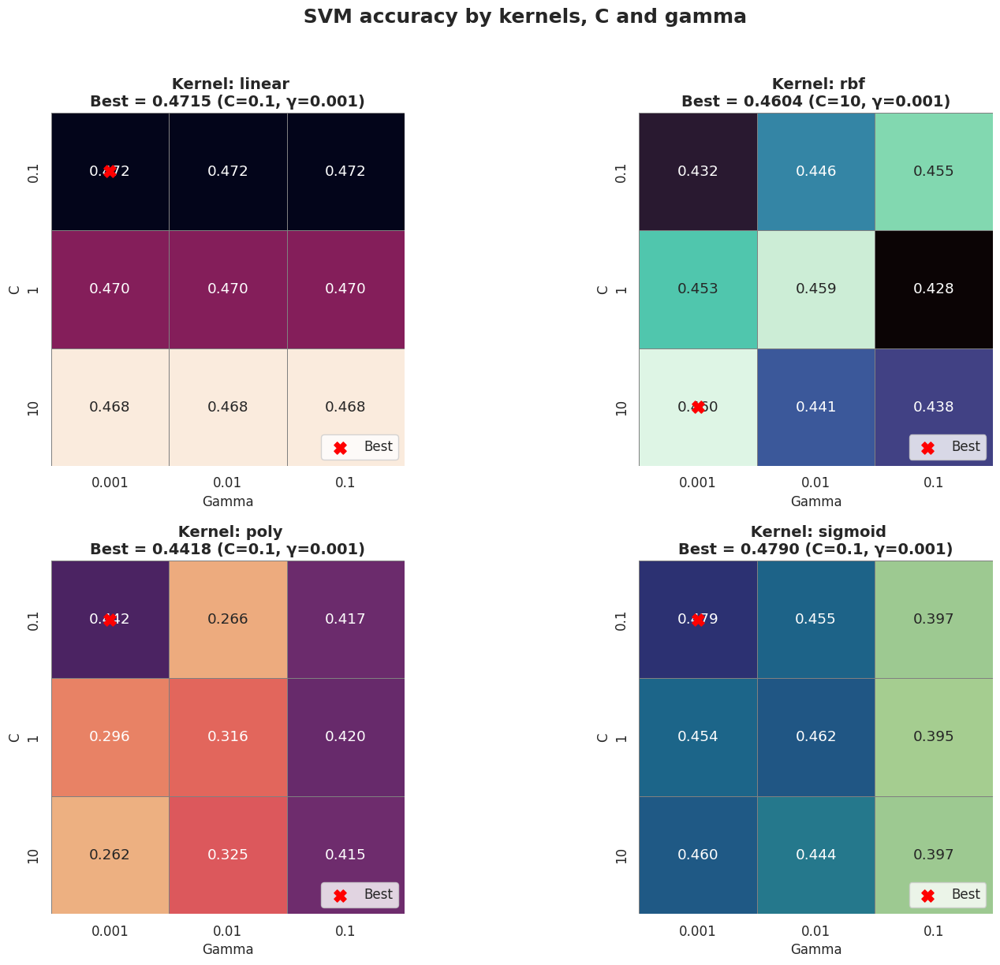

Summary of best models by kernel :
 linear: 0.4715 (C=0.1, gamma=0.001)
 rbf: 0.4604 (C=10, gamma=0.001)
 poly: 0.4418 (C=0.1, gamma=0.001)
 sigmoid: 0.4790 (C=0.1, gamma=0.001)


In [221]:
C_values = [0.1, 1, 10]
gamma_values = [0.001, 0.01, 0.1]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']
results_dict = {}

for kernel in kernels:
    results = np.zeros((len(C_values), len(gamma_values)))
    for i, C in enumerate(C_values):
        for j, gamma in enumerate(gamma_values):
            try:
                model = SVC(kernel=kernel, C=C, gamma=gamma, class_weight='balanced', random_state=42)
                model.fit(X_train_scaled_m2, y_train_m2)
                y_pred = model.predict(X_test_scaled_m2)
                acc = accuracy_score(y_test_m2, y_pred)
                results[i, j] = acc
            except Exception:
                results[i, j] = np.nan
    results_dict[kernel] = results

# Plot
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()
palettes = ['rocket_r', 'mako', 'flare', 'crest']

for idx, kernel in enumerate(kernels):
    data = results_dict[kernel]
    ax = axes[idx]
    sns.heatmap(
        data,
        annot=True,
        fmt=".3f",
        xticklabels=gamma_values,
        yticklabels=C_values,
        cmap=palettes[idx],
        cbar=False,
        square=True,
        linewidths=0.5,
        linecolor='gray',
        ax=ax
    )

    max_i, max_j = np.unravel_index(np.nanargmax(data), data.shape)
    best_acc = data[max_i, max_j]
    best_c = C_values[max_i]
    best_gamma = gamma_values[max_j]

    ax.set_title(f" Kernel: {kernel}\nBest = {best_acc:.4f} (C={best_c}, γ={best_gamma})", fontsize=14, weight='bold')
    ax.set_xlabel("Gamma", fontsize=12)
    ax.set_ylabel("C", fontsize=12)
    ax.scatter(max_j + 0.5, max_i + 0.5, s=120, color='red', marker='X', label='Best', zorder=10)
    ax.legend(loc='lower right')

plt.suptitle(" SVM accuracy by kernels, C and gamma", fontsize=18, weight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Résumé textuel
print("Summary of best models by kernel :")
for k, mat in results_dict.items():
    i, j = np.unravel_index(np.nanargmax(mat), mat.shape)
    print(f" {k}: {mat[i, j]:.4f} (C={C_values[i]}, gamma={gamma_values[j]})")

In [222]:
svm_balanced_m2 = SVC(
    kernel='rbf',
    C=10,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Training
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Prediction
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Evaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))
print("Confusion matrix SVM (m2, balanced):")
print(confusion_matrix(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.4603960396039604
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.46      0.51      0.48       239
           0       0.27      0.28      0.27       212
           1       0.60      0.54      0.56       357

    accuracy                           0.46       808
   macro avg       0.44      0.44      0.44       808
weighted avg       0.47      0.46      0.46       808

Confusion matrix SVM (m2, balanced):
[[122  67  50]
 [ 74  59  79]
 [ 72  94 191]]


Linear

In [223]:
svm_balanced_m2 = SVC(
    kernel='linear',
    C=1,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Training
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Prediction
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Evaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))
print("Confusion matrix SVM (m2, balanced):")
print(confusion_matrix(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.47029702970297027
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.48      0.51      0.50       239
           0       0.28      0.29      0.29       212
           1       0.58      0.55      0.57       357

    accuracy                           0.47       808
   macro avg       0.45      0.45      0.45       808
weighted avg       0.47      0.47      0.47       808

Confusion matrix SVM (m2, balanced):
[[122  60  57]
 [ 67  62  83]
 [ 64  97 196]]


Polynomial

In [224]:
svm_balanced_m2 = SVC(
    kernel='poly',
    C=0.1,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Training
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Prediction
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Evaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))
print("Confusion matrix SVM (m2, balanced):")
print(confusion_matrix(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.44183168316831684
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       239
           0       0.00      0.00      0.00       212
           1       0.44      1.00      0.61       357

    accuracy                           0.44       808
   macro avg       0.15      0.33      0.20       808
weighted avg       0.20      0.44      0.27       808

Confusion matrix SVM (m2, balanced):
[[  0   0 239]
 [  0   0 212]
 [  0   0 357]]


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Sigmoïd

In [225]:
svm_balanced_m2 = SVC(
    kernel='sigmoid',
    C=0.1,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Train
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Predict
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Evaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.47896039603960394
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.40      0.59      0.48       239
           0       0.50      0.00      0.01       212
           1       0.53      0.69      0.60       357

    accuracy                           0.48       808
   macro avg       0.48      0.43      0.36       808
weighted avg       0.49      0.48      0.41       808



Dans notre cas, il est préférable d'éviter le noyau linéaire. Nous prendrons donc le rbf dans le cas d'une SVM

In our case, it's preferable to avoid linear kernel so we're going to take the rbf one for SVM

In [226]:
svm_balanced_m2 = SVC(
    kernel='rbf',
    C=1,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

Random State test for stability:

#### 4) Logistic Regression

In [229]:
states = list(range(0, 100))
accuracies = []

for state in states:
    X_train_rs, X_test_rs, y_train_rs, y_test_rs = train_test_split(
        X_m2_encoded, y_m2, test_size=0.2, stratify=y_m2, random_state=state
    )
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X_train_rs, y_train_rs)
    y_pred_rs = model.predict(X_test_rs)
    acc = accuracy_score(y_test_rs, y_pred_rs)
    accuracies.append(acc)

best_state = states[accuracies.index(max(accuracies))]
best_acc = max(accuracies)

# Compute for a smart zoom
acc_min = min(accuracies)
acc_max = max(accuracies)
margin = 0.02
ymin = max(0, acc_min - margin)
ymax = min(1.0, acc_max + margin)

# Prepare the animation
fig, ax = plt.subplots(figsize=(12, 6))
line, = ax.plot([], [], marker='o', color='#0077b6', linewidth=2)
highlight, = ax.plot([], [], 'ro', markersize=10)
text = ax.text(0.72, 0.93, '', transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.9))

ax.set_xlim(0, 99)
ax.set_ylim(ymin, ymax)
ax.set_xlabel('random_state', fontsize=12)
ax.set_ylabel('Accuracy', fontsize=12)
ax.set_title(' Accuracy by random_state (Logistic Regression)', fontsize=16, weight='bold')
ax.grid(True, linestyle='--', alpha=0.4)

def animate(i):
    # Always give Matplotlib lists, NOT scalars
    line.set_data(list(states[:i+1]), list(accuracies[:i+1]))

    if states[i] == best_state:
        highlight.set_data([states[i]], [accuracies[i]])
        text.set_text(f"Best state: {best_state}\nAccuracy: {best_acc:.4f}")
    else:
        # hide point otherwise
        highlight.set_data([], [])

    return line, highlight, text

anim = FuncAnimation(fig, animate, frames=len(states), interval=70, blit=True)
plt.close()
HTML(anim.to_jshtml())

In [230]:
# 2. Multinomial logistic regression model
logreg_m2 = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    class_weight='balanced',
    max_iter=1000,
    random_state=13
)

# 3. Train
logreg_m2.fit(X_train_scaled_m2, y_train_m2)

# 4. Predict
y_pred_logreg = logreg_m2.predict(X_test_scaled_m2)

# 5. Evaluation
acc_logreg = accuracy_score(y_test_m2, y_pred_logreg)
print(f"Accuracy Logistic Regression (m2): {acc_logreg:.4f}\n")

print("Classification report Logistic Regression (m2) :")
print(classification_report(y_test_m2, y_pred_logreg))
print(classification_report(y_test_m2, y_pred_logreg))


Accuracy Logistic Regression (m2): 0.4740

Classification report Logistic Regression (m2) :
              precision    recall  f1-score   support

          -1       0.47      0.54      0.50       239
           0       0.27      0.23      0.25       212
           1       0.58      0.57      0.58       357

    accuracy                           0.47       808
   macro avg       0.44      0.45      0.44       808
weighted avg       0.47      0.47      0.47       808

              precision    recall  f1-score   support

          -1       0.47      0.54      0.50       239
           0       0.27      0.23      0.25       212
           1       0.58      0.57      0.58       357

    accuracy                           0.47       808
   macro avg       0.44      0.45      0.44       808
weighted avg       0.47      0.47      0.47       808



/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



#### 5) Random Forrest

In [231]:
# Train
rf_m2 = RandomForestClassifier(n_estimators=100, random_state=50, class_weight='balanced')
rf_m2.fit(X_train_m2, y_train_m2)

# Predict
y_pred_rf_m2 = rf_m2.predict(X_test_m2)

# Evaluation
print(f"Accuracy RF (m2): {accuracy_score(y_test_m2, y_pred_rf_m2):.4f}")
print("\nClassification report RF (m2) :")
print(classification_report(y_test_m2, y_pred_rf_m2))

Accuracy RF (m2): 0.4171

Classification report RF (m2) :
              precision    recall  f1-score   support

          -1       0.41      0.45      0.43       239
           0       0.28      0.31      0.29       212
           1       0.53      0.46      0.49       357

    accuracy                           0.42       808
   macro avg       0.41      0.41      0.40       808
weighted avg       0.43      0.42      0.42       808



Based on testing, different random_states produce almost identical results.

#### 6) XGBOOST


In [232]:
# 1. Recoding y in [0, 1, 2]
y_train_xgb = y_train_m2.replace({-1: 0, 0: 1, 1: 2})
y_test_xgb = y_test_m2.replace({-1: 0, 0: 1, 1: 2})

# 2. XGBoost model
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=45
)
model.fit(X_train_m2, y_train_xgb)
y_pred_encoded = model.predict(X_test_m2)

# 3. Reverse in [-1, 0, 1]
reverse_map = {0: -1, 1: 0, 2: 1}
y_pred_xgb = pd.Series(y_pred_encoded).map(reverse_map)

# 4. Evaluate
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy XGBoost:", accuracy_score(y_test_m2, y_pred_xgb))
print(classification_report(y_test_m2, y_pred_xgb))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:39:21] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.




Accuracy XGBoost: 0.44554455445544555
              precision    recall  f1-score   support

          -1       0.43      0.40      0.42       239
           0       0.28      0.22      0.24       212
           1       0.52      0.61      0.56       357

    accuracy                           0.45       808
   macro avg       0.41      0.41      0.41       808
weighted avg       0.43      0.45      0.43       808



# Model selection and robustness testing

#### 1) Cross Validation

KNN

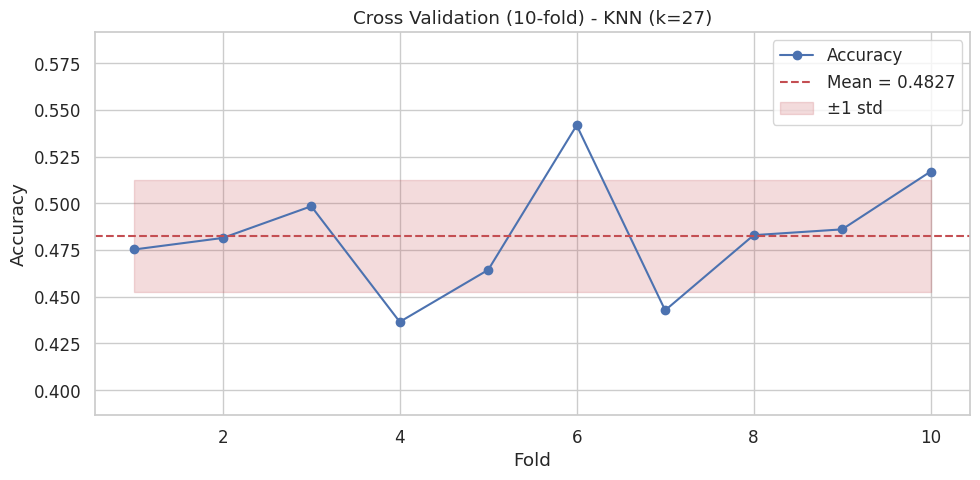

Mean accuracy (CV 10-fold) : 0.4827
Standard Deviation : 0.0301


In [233]:
# KNN model
knn_m2 = KNeighborsClassifier(n_neighbors=27)

# Cross validation
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Applying it on data
cv_scores = cross_val_score(knn_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')

# Mean and std of scores
cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Mean = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 std')
plt.title("Cross Validation (10-fold) - KNN (k=27)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Summary
print(f"Mean accuracy (CV 10-fold) : {cv_mean:.4f}")
print(f"Standard Deviation : {cv_std:.4f}")

SVM

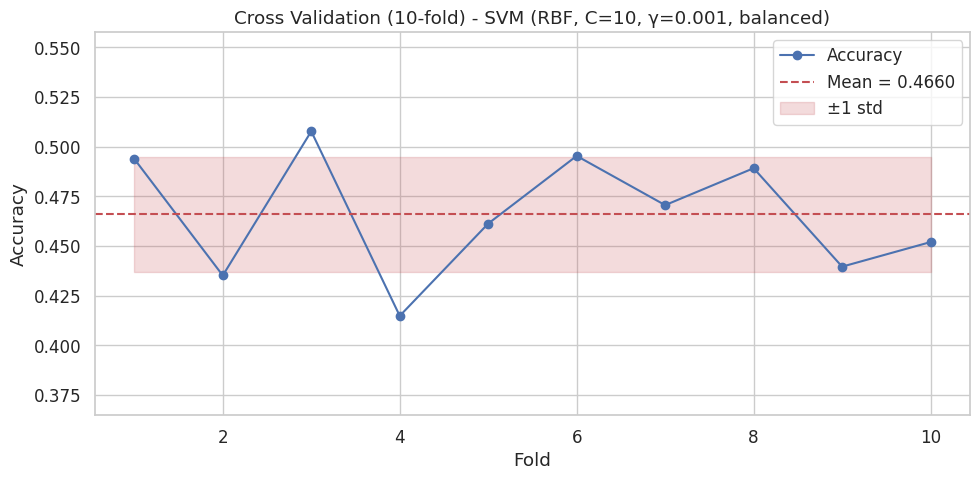

Mean accuracy (CV 10-fold) : 0.4660
 Standard Deviation : 0.0290


In [234]:
svm_balanced_m2 = SVC(
    kernel='rbf',
    C=10,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

cv = KFold(n_splits=10, shuffle=True, random_state=42)


cv_scores = cross_val_score(svm_balanced_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')


cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)


plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Mean = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 std')
plt.title("Cross Validation (10-fold) - SVM (RBF, C=10, γ=0.001, balanced)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Summary
print(f"Mean accuracy (CV 10-fold) : {cv_mean:.4f}")
print(f" Standard Deviation : {cv_std:.4f}")


Logistic Regression

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will 

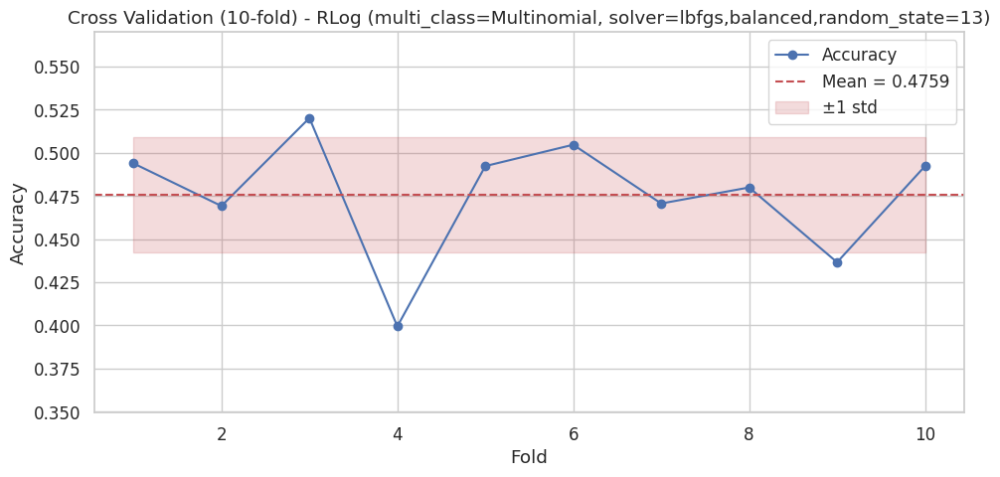

Mean accuracy (CV 10-fold) : 0.4759
 Standard Deviation : 0.0334


In [235]:
logreg_m2 = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    class_weight='balanced',
    max_iter=1000,
    random_state=13
)



cv = KFold(n_splits=10, shuffle=True, random_state=42)

cv_scores = cross_val_score(logreg_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')


cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)


plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Mean = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 std')
plt.title("Cross Validation (10-fold) - RLog (multi_class=Multinomial, solver=lbfgs,balanced,random_state=13)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Summary
print(f"Mean accuracy (CV 10-fold) : {cv_mean:.4f}")
print(f" Standard Deviation : {cv_std:.4f}")

Random Forest

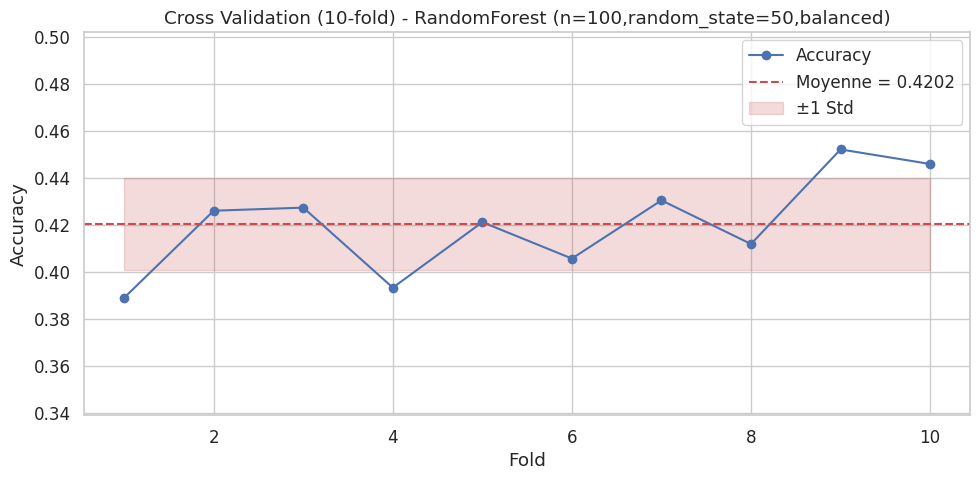

Mean accuracy (CV 10-fold) : 0.4202
 Standard deviation : 0.0196


In [236]:
rf_m2 = RandomForestClassifier(n_estimators=100, random_state=50, class_weight='balanced')

cv = KFold(n_splits=10, shuffle=True, random_state=42)


cv_scores = cross_val_score(rf_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')


cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)

plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Moyenne = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 Std')
plt.title("Cross Validation (10-fold) - RandomForest (n=100,random_state=50,balanced)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


print(f"Mean accuracy (CV 10-fold) : {cv_mean:.4f}")
print(f" Standard deviation : {cv_std:.4f}")

XGBoost

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:40:03] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:40:03] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:40:03] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:40:04] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:40:04] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[16:40

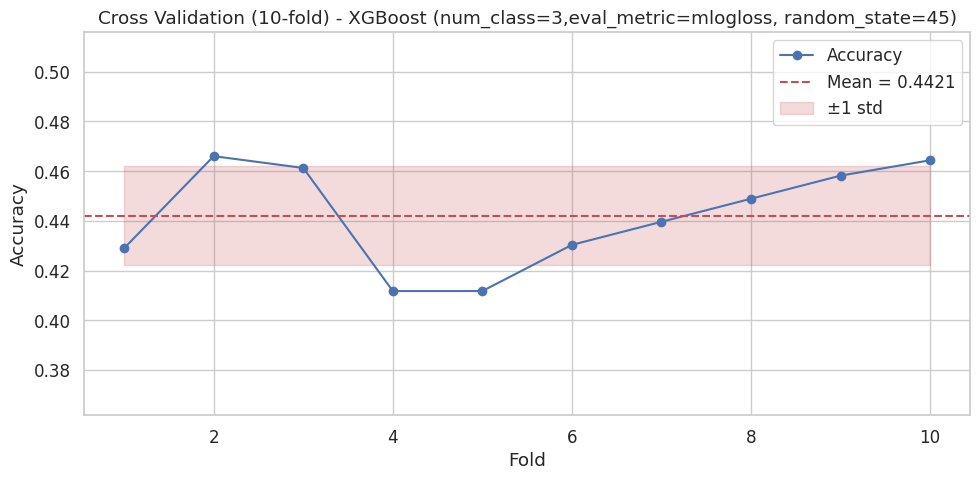

Mean accuracy (CV 10-fold) : 0.4421
 std : 0.0198


In [237]:
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=45
)

cv = KFold(n_splits=10, shuffle=True, random_state=42)


# Recoding classes for XGBoost : -1 → 0, 0 → 1, 1 → 2
y_train_xgb_cv = y_train_m2.replace({-1: 0, 0: 1, 1: 2})

cv_scores = cross_val_score(model, X_train_scaled_m2, y_train_xgb_cv, cv=cv, scoring='accuracy')


cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)


plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Mean = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 std')
plt.title("Cross Validation (10-fold) - XGBoost (num_class=3,eval_metric=mlogloss, random_state=45)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


print(f"Mean accuracy (CV 10-fold) : {cv_mean:.4f}")
print(f" std : {cv_std:.4f}")

#### 2) Bonus: Robustness test with noise (to avoid overfitting)

In [238]:
# Copy of X_train noised
np.random.seed(42)  # for reproductibility
noise_factor = 2  # intensity of noise

# Add a gaussian noise to features
X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)

# Training on noised data
knn_m2.fit(X_train_noisy, y_train_m2)

# Évaluation on clean data(not the noised ones)
y_pred_noisy = knn_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy on test KNN (model trained with noise) : {acc_noisy:.4f}")

 Accuracy on test KNN (model trained with noise) : 0.4567


In [239]:
#Same for SVM
np.random.seed(42)
noise_factor = 2


X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)


svm_balanced_m2.fit(X_train_noisy, y_train_m2)


y_pred_noisy = svm_balanced_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy on test SVM (model trained with noise) : {acc_noisy:.4f}")

 Accuracy on test SVM (model trained with noise) : 0.4691


In [240]:
#Same on Log Reg
np.random.seed(42)
noise_factor = 2


X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)


logreg_m2.fit(X_train_noisy, y_train_m2)


y_pred_noisy = logreg_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy on test Logistic Regression (model trained with noise) : {acc_noisy:.4f}")

 Accuracy on test Logistic Regression (model trained with noise) : 0.4579


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



In [241]:
#Random Forest
np.random.seed(42)
noise_factor = 2


X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)


rf_m2.fit(X_train_noisy, y_train_m2)


y_pred_noisy = rf_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy on test Random Forest (model trained with noise) : : {acc_noisy:.4f}")

 Accuracy on test Random Forest (model trained with noise) : : 0.4851


In [242]:
#XGboost

np.random.seed(42)
noise_factor = 2

# Transforming labels on 0, 1, 2
y_train_012 = y_train_m2.replace({-1: 0, 0: 1, 1: 2})
y_test_012 = y_test_m2.replace({-1: 0, 0: 1, 1: 2})

# Add gaussian noise on training features
X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(
    loc=0.0, scale=1.0, size=X_train_scaled_m2.shape
)

#Training and predicting
model = XGBClassifier()
model.fit(X_train_noisy, y_train_012)

y_pred_noisy = model.predict(X_test_scaled_m2)

# Evaluation
acc_noisy = accuracy_score(y_test_012, y_pred_noisy)
print(f"Accuracy on test Xgboost (model trained with noise) : {acc_noisy:.4f}")

Accuracy on test Xgboost (model trained with noise) : 0.4542


# Prediction

In [243]:
X_pred_m2 = data_matchs2_m2[X_train_m2.columns]

# 2. Standardizing with the previous training scaler
X_pred_scaled_m2 = scaler_m2.transform(X_pred_m2)

# 3. Prediction
y_pred_final_m2 = svm_balanced_m2.predict(X_pred_scaled_m2)


In [244]:
prediction_example = pd.read_csv("prediction_example.csv")
prediction_example["logpred"] = y_pred_final_m2

prediction_example.to_csv("MaPredictionFinale.csv", index=False) # index=False to avoid adding external index to pandas
# Done!

In [245]:
#Checking file conformity
def estConforme(monFichier_csv):
    votre_prediction = pd.read_csv(monFichier_csv)

    fichier_exemple = pd.read_csv("prediction_example.csv")

    assert votre_prediction.columns[1] == fichier_exemple.columns[1], f"Attention, votre colonne de prédiction doit s'appeler {fichier_exemple.columns[1]}, elle s'appelle '{votre_prediction.columns[1]}'"
    assert len(votre_prediction) == len(fichier_exemple), f"Attention, vous devriez avoir {len(fichier_exemple)} prédiction dans votre fichier, il en contient '{len(votre_prediction)}'"

    assert np.all(votre_prediction.iloc[:,0] == fichier_exemple.iloc[:, 0])

    print("File is ok!")

estConforme("MaPredictionFinale.csv")

File is ok!
